## Py-imp is the section of the project that is implemented using Python
This notebook is the modelling section

In [1]:
# Warning options (before all imports)
import warnings
warnings.filterwarnings('ignore')
# warnings.simplefilter(action='ignore', category=UserWarning)
# warnings.simplefilter(action='ignore', category=FutureWarning)
# %xmode Verbose # simplified traceback when an exception occurs
%xmode Plain

Exception reporting mode: Plain


### Install needed packages


In [2]:
# Install a conda package in the current Jupyter kernel
import sys
# !mamba install -c conda-forge --yes --prefix {sys.prefix} <pkg>
# !conda install -c conda-forge --yes --prefix {sys.prefix} <pkg>

# Install a pip package in the current Jupyter kernel
# import sys
# !{sys.executable} - m pip install <pkg>

In [3]:
# 'sklearn for Time series data'
# !mamba install -c conda-forge --yes --prefix {sys.prefix} sktime-all-extras
# 'for Time series data'
# !mamba install -c conda-forge --yes --prefix {sys.prefix} feature_engine
# !mamba install -c conda-forge --yes --prefix {sys.prefix} mlxtend
# !mamba install -c conda-forge --yes --prefix {sys.prefix} statsmodels
# !mamba install -c conda-forge --yes --prefix {sys.prefix} ptitprince

# for tf.keras.utils.plot_model
# !mamba install -c conda-forge --yes --prefix {sys.prefix} graphviz python-graphviz

# # upgrade pip
# !{sys.executable} -m pip install --upgrade pip

# # Debug pip
# # Uninstall SetupTools:
# !{sys.executable} -m pip uninstall pip setuptools
# # Reinstall Setuptools:
# !{sys.executable} -m pip install --upgrade setuptools

# feature engineering Time series data
# !{sys.executable} -m pip install tsfresh
# pretty Matplotlib plots
# !{sys.executable} -m pip install git+https://github.com/iammelvink/LovelyPlots
# better progress bar
# !{sys.executable} -m pip install rich
# better 'describe'
# !{sys.executable} -m pip install skimpy
# For size encoded heatmaps
# !{sys.executable} -m pip install heatmapz
# XGBoost
# !{sys.executable} -m pip install xgboost
# !{sys.executable} -m pip install lightgbm
# !{sys.executable} -m pip install catboost
# !{sys.executable} -m pip install fastprogress
# !{sys.executable} -m pip install matplotx[all]
# !{sys.executable} -m pip install matplotx
# !{sys.executable} -m pip install lux
# !jupyter nbextension install --py luxwidget
# !jupyter nbextension enable --py luxwidget

# !{sys.executable} -m pip install sweetviz
# !{sys.executable} -m pip install yellowbrick
# !{sys.executable} -m pip install autoviz
# !{sys.executable} -m pip install pandas-profiling
# !{sys.executable} -m pip install dtale
# !{sys.executable} -m pip install sketch
# !{sys.executable} -m pip install watermark
# !{sys.executable} -m pip install snoop
# for tf.keras.utils.plot_model
# !{sys.executable} -m pip install pydot
# for optimising hyperparameters
# !{sys.executable} -m pip install optuna
# to save models to files
# !{sys.executable} -m pip install joblib
# for creating visualisations of model architectures
# !{sys.executable} -m pip install git+https://github.com/paulgavrikov/visualkeras
# !{sys.executable} -m pip install git+https://github.com/RedaOps/ann-visualizer
# !{sys.executable} -m pip install visualkeras

# for feature selection
# !{sys.executable} -m pip install Boruta
# for feature selection BorutaShap
# !{sys.executable} -m pip install git+https://github.com/Ekeany/Boruta-Shap
# !{sys.executable} -m pip install BorutaShap
# for feature selection using SHAP
# !{sys.executable} -m pip install shap-hypetune
# to export .ipynb to .pdf
# !{sys.executable} -m pip install nbconvert
# !{sys.executable} -m pip install adjustText

# to save models to files
# !mamba install -c conda-forge --yes --prefix {sys.prefix} h5py==3.9.0 --force-reinstall
# !{sys.executable} -m pip install h5py==3.9.0 --force-reinstall

# !{sys.executable} -m pip install matplotlib --force-reinstall
# !{sys.executable} -m pip install matplotlib pandas==1.5.3 --force-reinstall

In [4]:
# %pip install <pkg> --user

### Importing libraries


In [5]:
import snoop

snoop.install()
%load_ext snoop
# eg. put this before debug code %%snoop

from skimpy import skim  # better describe
from rich.progress import track
import os, random
from io import BytesIO
import timeit

import math
from scipy.stats import chi2_contingency

# Dataset reducer
# Source: https://www.kaggle.com/code/joseguzman/reducing/notebook
from reducing import PandaReducer

# Local ChatGPT-ish
import sketch
os.environ["SKETCH_MAX_COLUMNS"] = "300"
os.environ["SKETCH_ROW_OVERRIDE_LIMIT"] = "5"

# Run locally
# os.environ["LAMBDAPROMPT_BACKEND"] = "StarCoder"
# os.environ["SKETCH_USE_REMOTE_LAMBDAPROMPT"] = "False"
# os.environ["HF_ACCESS_TOKEN"] = "your_hugging_face_token"

# EDA
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib import cycler
from matplotlib import rcParams
# matplotlib extensions
import matplotx
# For better distribution plots
# import ptitprince as pt
# For size encoded heatmaps
from heatmap import *
# from adjustText import adjust_text

# Pre-processing
from sklearn.preprocessing import *
from feature_engine.creation import CyclicalFeatures
from feature_engine.datetime import DatetimeFeatures
from feature_engine.imputation import DropMissingData
from feature_engine.selection import DropFeatures
from feature_engine.timeseries.forecasting import *
from mlxtend.evaluate.time_series import *
import datetime
from datetime import datetime as dt
from dateutil.relativedelta import *
from sklearn.compose import *
from sklearn.preprocessing import *
from sklearn.impute import *
from sklearn.pipeline import *
import itertools

# Modeling
import tensorflow as tf
from tensorflow.keras.utils import *
from sktime.forecasting.base import ForecastingHorizon
from sktime.forecasting.model_selection import *
from sklearn.model_selection import *
from sktime.utils.plotting import plot_series
from sklearn.utils import *
from sklearn.ensemble import *
from sklearn.naive_bayes import *
from sklearn.metrics import *
from sklearn import metrics
from sklearn.linear_model import *
from sklearn.neighbors import *
from sklearn.tree import *
from sklearn.svm import *
from xgboost import *
from lightgbm import *
from catboost import *
from sklearn.utils.class_weight import *
from sklearn.exceptions import NotFittedError

# To save models to files
# import pickle
import joblib # for saving models to .pkl or.sav files, for scikit-learn models
import h5py # for saving models to .hdf5 files, for TensorFlow models
from tensorflow.keras.models import *
# saved_model = load_model('model_name.hdf5')

# for optimising hyperparameters
import optuna
# to visualise of model architectures
# import visualkeras
# from ann_visualizer.visualize import ann_viz;
from shaphypetune import *

np.set_printoptions(linewidth=140)

# Pandas options
# pd.options.display.precision = 3
pd.options.display.max_rows = 50
pd.options.display.max_columns = 50
pd.options.mode.chained_assignment=None

pd.set_option('display.width', 140)

# Display Pipelines and models
from sklearn import set_config
set_config(display='diagram')

plt.style.reload_library()
# plt.style.use(matplotx.styles.dufte)
# plt.style.use('ipynb') # prettier plots
plt.style.use(['ipynb', 'colors10-markers'])
# Always put after custom styles
rcParams['axes.spines.top'] = False # remove top border of plot
rcParams['axes.spines.bottom'] = True # keep top border of plot
rcParams['axes.spines.left'] = True # keep top border of plot
rcParams['axes.spines.right'] = True # keep top border of plot
# rcParams['axes.grid' ] = True
rcParams["figure.figsize"] = plt.rcParamsDefault["figure.figsize"] # reset figsize

# To display charts in Jupyter
%matplotlib inline

# Matplotlib options
rcParams['figure.dpi'] = 600
# rcParams['figure.figsize'] = 8, 6
rcParams['legend.fontsize'] = "large"
rcParams['xtick.major.size'] = 4
rcParams['xtick.minor.size'] = 1
rcParams["figure.autolayout"] = True

# For reproducibility
# rng = np.random.RandomState(0)
rng = 777
os.environ['PYTHONHASHSEED'] = str(rng)
random.seed(rng)
np.random.seed(rng)
tf.random.set_seed(rng)

# Set the seed using keras.utils.set_random_seed. This will set:
# 1) `numpy` seed
# 2) `tensorflow` random seed
# 3) `python` random seed
tf.keras.utils.set_random_seed(rng)

# This will make TensorFlow ops as deterministic as possible, but it will
# affect the overall performance, so it's not enabled by default.
# `enable_op_determinism()` is introduced in TensorFlow 2.9.
# tf.config.experimental.enable_op_determinism()
os.environ['TF_DETERMINISTIC_OPS'] = "True"
os.environ["TF_DISABLE_SEGMENT_REDUCTION_OP_DETERMINISM_EXCEPTIONS"] = "True"

In [6]:
%load_ext watermark
# %watermark
%watermark --iversions

seaborn   : 0.11.0
sklearn   : 1.3.1
sys       : 3.8.17 | packaged by conda-forge | (default, Jun 16 2023, 07:01:59) [MSC v.1929 64 bit (AMD64)]
xgboost   : 2.0.0
h5py      : 3.9.0
matplotx  : 0.3.10
optuna    : 3.3.0
numpy     : 1.23.5
tensorflow: 2.10.1
keras     : 2.10.0
pandas    : 1.5.3
hyperopt  : 0.2.5
scipy     : 1.10.1
matplotlib: 3.7.1
sketch    : 0.4.2
joblib    : 1.3.2



In [7]:
# Helper functions for categorical type casting
def summarize_categoricals(df, show_levels=False):
    """
        Display uniqueness in each column
    """
    data = [[df[c].unique(), len(df[c].unique()), df[c].isnull().sum()]
            for c in df.columns]
    df_temp = pd.DataFrame(data, index=df.columns,
                           columns=['Levels', 'No. of Levels',
                                    'No. of Missing Values'])
    return df_temp.iloc[:, 0 if show_levels else 1:]


def return_categoricals(df, threshold=5):
    """
        Returns a list of columns that have less than or equal to
        `threshold` number of unique categorical levels
    """
    return list(filter(lambda c: c if len(df[c].unique()) <= threshold else None,
                       df.columns))


def to_categorical(columns, df):
    """
        Converts the columns passed in `columns` to categorical datatype
    """
    for col in columns:
        df[col] = df[col].astype('category')
    return df

In [8]:
# allow memory growth of GPU
physical_devices = tf.config.experimental.list_physical_devices('GPU')
for device in physical_devices:
    tf.config.experimental.set_memory_growth(device, True)

<a id="import-and-clean-data"></a>
## 1.   Import and Clean Data

In [9]:
data_path = "../../data/d_pump_cleaned/"

df_pdm_pump = PandaReducer().reduce(
    pd.read_csv(f"{data_path}/final_pdm_pump_cleaned.csv", parse_dates=["datetime"]))

# # Changing format's of date-time columns. Sort based on date for better readability
tables = [df_pdm_pump]
for dataset in tables:
    dataset.sort_values(["datetime"],
    inplace=True, ignore_index=True)

Dataset reduced 51.36% : 354.02 to 172.21 MB in 4.62 seconds


In [10]:
to_cast = return_categoricals(df_pdm_pump, threshold=5)
df_pdm_pump = to_categorical(to_cast, df_pdm_pump)
df_pdm_pump.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 218880 entries, 0 to 218879
Data columns (total 212 columns):
 #    Column                    Dtype         
---   ------                    -----         
 0    datetime                  datetime64[ns]
 1    sensor_00                 float32       
 2    sensor_01                 float32       
 3    sensor_02                 float32       
 4    sensor_03                 float32       
 5    sensor_04                 float32       
 6    sensor_05                 float32       
 7    sensor_06                 float32       
 8    sensor_07                 float32       
 9    sensor_08                 float32       
 10   sensor_09                 float32       
 11   sensor_10                 float32       
 12   sensor_11                 float32       
 13   sensor_12                 float32       
 14   sensor_13                 float32       
 15   sensor_14                 float32       
 16   sensor_16                 float32   

In [11]:
print(f"Summary for DataFrame: df_pdm_pump")
summarize_categoricals(df_pdm_pump, show_levels=True)

Summary for DataFrame: df_pdm_pump


,Levels,No. of Levels,No. of Missing Values
datetime,"[2018-04-02T00:00:00.000000000, 2018-04-02T00:...",218880,0
sensor_00,"[2.459491, 2.449653, 2.46441, 2.444734, 2.4407...",1245,0
sensor_01,"[45.83333, 45.74652, 45.61632, 45.65972, 45.78...",698,0
sensor_02,"[52.34375, 52.30035, 52.38715, 52.343746, 52.4...",686,0
sensor_03,"[44.791664, 44.79166, 44.87847, 44.92188, 44.9...",492,0
...,...,...,...
month_sin,"[1.224647e-16, -7.071068e-01, -1.000000e+00, -...",4,0
month_cos,"[-1, 0, 1] Categories (3, int64): [-1, 0, 1]",3,0
hour_sin,"[0] Categories (1, int64): [0]",1,0
hour_cos,"[1.0, 0.96291727, 0.8544194, 0.6825532, 0.4600...",12,0


Descriptive statistics for df_pdm_pump data

In [12]:
print("Total number of df_pdm_pump records: %d" % len(df_pdm_pump.index))
print(df_pdm_pump.head(3))
# skim(df_pdm_pump)
df_pdm_pump.describe().T.style.background_gradient(axis=0, cmap='YlOrRd')

Total number of df_pdm_pump records: 218880
             datetime  sensor_00  sensor_01  sensor_02  sensor_03   sensor_04  sensor_05  sensor_06  sensor_07  sensor_08  sensor_09  \
0 2018-04-02 00:00:00   2.459491  45.833328   52.34375  44.791664  639.583313  78.575813   13.09317  16.167530   15.49479   15.11863   
1 2018-04-02 00:01:00   2.459491  45.833328   52.34375  44.791664  639.583313  78.575813   13.09317  16.167530   15.49479   15.11863   
2 2018-04-02 00:02:00   2.449653  45.746521   52.30035  44.791664  634.838013  79.064934   13.12211  16.131359   15.56713   15.11863   

   sensor_10  sensor_11  sensor_12  sensor_13   sensor_14   sensor_16   sensor_17  sensor_18   sensor_19   sensor_20   sensor_21  \
0  39.106178  48.769089  34.889641   1.630659  419.414490  462.781006  458.733002   2.510471  664.629211  399.444794  880.046570   
1  39.106178  48.769089  34.889641   1.630659  419.414490  462.781006  458.733002   2.510471  664.629211  399.444794  880.046570   
2  39.541698  4

,count,mean,std,min,25%,50%,75%,max
sensor_00,218880.000000,2.280020,0.587167,0.000000,2.416204,2.455556,2.499826,2.549016
sensor_01,218880.000000,47.599087,3.312211,0.000000,46.310760,48.133678,49.479160,56.727428
sensor_02,218880.000000,50.855911,3.676656,33.159721,50.390621,51.649300,52.777771,56.032990
sensor_03,218880.000000,43.742325,2.423205,31.640619,42.838539,44.227428,45.225693,48.220490
sensor_04,218880.000000,590.377991,144.470993,2.798032,626.620361,632.638916,637.615723,800.000000
sensor_05,218880.000000,73.387497,17.356197,0.000000,69.939972,75.596478,80.947273,99.999878
sensor_06,218880.000000,13.208711,2.911418,0.014468,13.324650,13.642940,14.539930,22.251160
sensor_07,218880.000000,15.493954,3.162599,0.000000,15.856480,16.167530,16.427950,23.596640
sensor_08,218880.000000,14.867301,2.965941,0.028935,15.147570,15.451390,15.697340,24.348961
sensor_09,218880.000000,14.487881,2.965429,0.000000,15.010130,15.082470,15.118630,25.000000


In [13]:
# Duration of the df_pdm_pump data
print("Duration of the df_pdm_pump data:")
df_pdm_pump.datetime.min(), df_pdm_pump.datetime.max()

Duration of the df_pdm_pump data:


(Timestamp('2018-04-02 00:00:00'), Timestamp('2018-08-31 23:59:00'))

<a id="data-preprocessing"></a>
## 4.   Data Preprocessing

Data needs to be one-hot-encoded before applying machine learning models.

#### Using first 20000 to experiment with

In [14]:
# Using first 20000 to experiment with
# df_pdm_pump = df_pdm_pump.iloc[:20000]

In [15]:
# Drop datatime because this is a prediction and not forecasting
df_pdm_pump.drop(['datetime'], axis=1, inplace=True)

In [16]:
# reduce size of the dataframe
df_pdm_pump = PandaReducer().reduce(df_pdm_pump)
df_pdm_pump.info()

Dataset reduced 0.00% : 169.92 to 169.91 MB in 1.40 seconds
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 218880 entries, 0 to 218879
Columns: 211 entries, sensor_00 to pump_status
dtypes: category(6), float32(201), int8(4)
memory usage: 169.9 MB


In [17]:
X = df_pdm_pump.iloc[:, :-1]
# X = df_pdm_pump.drop(['datetime'], axis=1).iloc[:, :-1]
y = df_pdm_pump['pump_status']

#### Features before feature selection

In [18]:
X.shape

(218880, 210)

In [19]:
X.head(3)

,sensor_00,sensor_01,sensor_02,sensor_03,sensor_04,sensor_05,sensor_06,sensor_07,sensor_08,sensor_09,sensor_10,sensor_11,sensor_12,sensor_13,sensor_14,sensor_16,sensor_17,sensor_18,sensor_19,sensor_20,sensor_21,sensor_22,sensor_23,sensor_24,sensor_25,...,sensor_30_window_3H_mean,sensor_31_window_3H_mean,sensor_32_window_3H_mean,sensor_33_window_3H_mean,sensor_34_window_3H_mean,sensor_35_window_3H_mean,sensor_36_window_3H_mean,sensor_37_window_3H_mean,sensor_38_window_3H_mean,sensor_39_window_3H_mean,sensor_40_window_3H_mean,sensor_41_window_3H_mean,sensor_42_window_3H_mean,sensor_43_window_3H_mean,sensor_44_window_3H_mean,sensor_45_window_3H_mean,sensor_46_window_3H_mean,sensor_47_window_3H_mean,sensor_48_window_3H_mean,sensor_49_window_3H_mean,sensor_51_window_3H_mean,month_sin,month_cos,hour_sin,hour_cos
0,2.459491,45.833328,52.34375,44.791664,639.583313,78.575813,13.09317,16.167530,15.49479,15.11863,39.106178,48.769089,34.889641,1.630659,419.414490,462.781006,458.733002,2.510471,664.629211,399.444794,880.046570,451.345398,948.018677,626.647583,738.939026,...,657.932068,751.339661,702.056885,459.833740,167.040268,326.382812,200.904358,103.390602,44.231770,31.889465,65.983795,31.041666,31.176214,38.136570,45.298031,44.645382,40.049511,37.763630,191.173157,77.284271,220.801178,1.224647e-16,-1,0,1.0
1,2.459491,45.833328,52.34375,44.791664,639.583313,78.575813,13.09317,16.167530,15.49479,15.11863,39.106178,48.769089,34.889641,1.630659,419.414490,462.781006,458.733002,2.510471,664.629211,399.444794,880.046570,451.345398,948.018677,626.647583,738.939026,...,657.605469,751.458313,701.966248,459.883362,167.014343,326.266174,200.896667,103.427429,44.244789,31.882233,65.918686,31.041666,31.176214,38.107635,45.256237,44.701645,40.041473,37.760414,190.951324,77.363037,220.791534,1.224647e-16,-1,0,1.0
2,2.449653,45.746521,52.30035,44.791664,634.838013,79.064934,13.12211,16.131359,15.56713,15.11863,39.541698,49.363251,34.707630,1.698600,420.712189,465.388214,465.173187,2.568181,666.649170,400.791595,882.583984,451.393005,952.205505,630.678101,737.267883,...,657.710876,751.602966,702.071472,459.864624,166.991486,326.175201,200.901489,103.588646,44.249130,31.864870,65.882523,31.041666,31.176214,38.091721,45.206406,44.748264,40.038258,37.758808,190.740738,77.445023,220.791534,1.224647e-16,-1,0,1.0


#### Load trained feature selection model for modelling phase

In [20]:
# # load the model from disk
filename = '../../code/pump/models/four_phase_selector.sav'
boruta_shap_selector = joblib.load(open(filename, 'rb'))

In [21]:
X_reduced = boruta_shap_selector.Subset()

In [22]:
# print(boruta_shap_selector.Subset().columns)

In [23]:
col_list = X_reduced.columns.tolist()

#### Apply feature selection

In [24]:
X = X.loc[:, col_list]

In [25]:
X.shape

(218880, 4)

In [26]:
X.head(3)

,sensor_11_window_3H_mean,sensor_12_window_3H_mean,sensor_05,sensor_10_window_3H_mean
0,49.143627,35.166382,78.575813,40.335556
1,49.148724,35.173748,78.575813,40.352913
2,49.155159,35.185909,79.064934,40.376858


In [27]:
# OR, load CSV file with list of features to keep
# features_to_keep = pd.read_csv("../../code/pump/models/features_to_keep.csv", header=None)
# features_to_keep = features_to_keep.values.tolist()

In [28]:
# print(len(features_to_keep))

In [29]:
# features_to_keep

<a id="train-test-split"></a>
### 4.1.   Train-Test split
CatBoost classifier does not require any knd of preprocessing while Naive bayes requires a different kind of preprocesing. Therefore, we will use raw/ unmodified data (`X_train_cat, X_test_cat, y_train_cat, y_test_cat`) for CatBoost and preprocessed data (`X_train, X_test, y_train, y_test`) for all other classifiers. For Naive Bayes, we will use the raw data (`X_train_cat, X_test_cat, y_train_cat, y_test_cat`) and preprocess it as required in the Naive Bayes section.

In [30]:
categorical_columns = list(X.select_dtypes(include='category').columns)
numeric_columns = list(X.select_dtypes(exclude='category').columns)

In [31]:
data_splits = temporal_train_test_split(X, y, test_size=0.30)
X_train, X_test, y_train, y_test = data_splits

# For CatBoost and Naive Bayes
data_splits = temporal_train_test_split(X, y, test_size=0.30)
X_train_cat, X_test_cat, y_train_cat, y_test_cat = data_splits

list(map(lambda X: X.shape, [X, y, X_train, X_test, y_train, y_test]))

[(218880, 4), (218880,), (153216, 4), (65664, 4), (153216,), (65664,)]

In [32]:
# fig, ax = plot_series(y_train, y_test, labels=["y_train", "y_test"])

In [33]:
pd.Series(y).value_counts()

normal        204396
recovering     14477
broken             7
Name: pump_status, dtype: int64

In [34]:
plt.figure(figsize=(15, 10))
ax = pd.Series(y).value_counts().plot(kind='bar')
plt.ylabel('Count')
plt.xlabel('Pump status')
plt.title('Count and percentage of each Pump status')
total = pd.Series(y).count()
for p in ax.patches:
    count = p.get_height()
    percent = '{:.3f}%'.format(100 * count / total)
    ax.annotate(str(count) + '\n' + percent + '\n', (p.get_x() + p.get_width() / 2., p.get_height()),
                va='center', ha='center', fontweight='bold', 
                color='#000', xytext=(0, 10), textcoords='offset points')
plt.show();

<a id="preprocessing-pipeline%3A-one-hot-encoding%2C-standardization"></a>
### 4.2.   Preprocessing Pipeline: One-hot Encoding, Standardization
We need to standardize the continuous or quantitative variables/ features before applying Machine Learning models. This is important because if we don't standardize the features, features with high variance that are orders of magnitude larger that others might dominate the model fitting process and causing the model unable to learn from other features (with lower variance) correctly as expected. <br/>
There is no need to standardize categorical variables.

To know which algorithms require standardization/ feature scaling read this useful [stackoverflow post](https://stats.stackexchange.com/questions/244507/what-algorithms-need-feature-scaling-beside-from-svm).

***Also we need to standardize the data only after performing train-test split because if we standardize before splitting then there is a chance for some information leak from the test set into the train set. We always want the test set to be completely new to the ML models. [Read more](https://scikit-learn.org/stable/modules/compose.html#columntransformer-for-heterogeneous-data)***

In [35]:
numeric_transformer = Pipeline(steps=[
    ('scaler', StandardScaler())])

categorical_transformer = Pipeline(steps=[('onehot', OneHotEncoder(drop='first', dtype=np.int8))]) # np.int8 = 0 to 255, 1 byte. ONLY POSITIVE INTEGERS

## Column Transformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_columns),
        ('cat', categorical_transformer, categorical_columns)],
    remainder='passthrough')

## Applying Column Transformer
X_train = preprocessor.fit_transform(X_train)
X_test = preprocessor.transform(X_test)

## Label encoding
y_trans = LabelEncoder()
y_train = y_trans.fit_transform(y_train)
y_test = y_trans.transform(y_test)

In [36]:
# Save feature names after one-hot encoding for feature importances plots
try:
    # if no error occurs
    feature_names = list(preprocessor.named_transformers_['cat'].named_steps['onehot'].get_feature_names_out())
    feature_names = numeric_columns + feature_names
# if an error occurs, get the feature_names from X
except:
    feature_names = list(X.columns)

#### Features after feature selection

In [37]:
print(feature_names)
print(len(feature_names))

['sensor_11_window_3H_mean', 'sensor_12_window_3H_mean', 'sensor_05', 'sensor_10_window_3H_mean']
4


In [38]:
list(map(lambda X: X.shape, [X, y, X_train, X_test, y_train, y_test]))

[(218880, 4), (218880,), (153216, 4), (65664, 4), (153216,), (65664,)]

<a id="data-modeling"></a>
## 5.   Data Modeling
Since the dataset is imbalanced we will be using class-weighted/ cost-sensitive learning. In cost-sensitive learning, a weighted cost function is used. Therefore, misclassifying a sample from the minority class will cost the classifiers more than misclassifying a sample from the majority class. In most of the Sklearn classifiers, cost-sensitive learning can be enabled by setting `class_weight='balanced'`.

<a id="utility-functions"></a>
### 5.1.   Utility Functions

In [39]:
def confusion_plot(matrix, labels=None):
    """ Display binary confusion matrix as a Seaborn heatmap """

    # labels = labels if labels else pd.Series(y).unique()
    labels = pd.Series(y).unique()
    
    fig, ax = plt.subplots(nrows=1, ncols=1)
    sns.heatmap(data=matrix, cmap='YlOrRd', annot=True, fmt='d',
                xticklabels=labels, yticklabels=labels, ax=ax)
    ax.set_xlabel('PREDICTED')
    ax.set_ylabel('ACTUAL')
    ax.set_title('Confusion Matrix')
      # Plot the text on each cell
    # for i, j in itertools.product(range(matrix.shape[0]), range(matrix.shape[1])):
    #     plt.text(j, i, f"{matrix[i, j]} ({matrix[i, j]*100:.1f}%)",
    #             horizontalalignment="center")
    plt.close()
    
    return fig

In [40]:
def roc_plot(y_true, y_probs, label, compare=False, ax=None):
    """ Plot Receiver Operating Characteristic (ROC) curve 
        Set `compare=True` to use this function to compare classifiers. """

    # Plotting ROC curve for multi-class classification not working yet
    fpr, tpr, thresh = roc_curve(y_true, y_probs, drop_intermediate=False)
    auc = roc_auc_score(y_true, y_probs, multi_class='ovr', average='weighted')
    # auc = round(roc_auc_score(y_true, y_probs, multi_class='ovr', average='weighted'), 2)
    
    fig, axis = (None, ax) if ax else plt.subplots(nrows=1, ncols=1)
    label = ' '.join([label, f'({auc})']) if compare else None
    sns.lineplot(x=fpr, y=tpr, ax=axis,
                 estimator=None, label=label)
    
    if compare:
        axis.legend(title='Classifier (AUC)', loc='lower right')
    else:
        axis.text(0.72, 0.05, f'AUC = { auc }', fontsize=12,
                  bbox=dict(facecolor='green', alpha=0.4, pad=5))
            
        # Plot No-Info classifier
        axis.fill_between(fpr, fpr, tpr, alpha=0.3, edgecolor='g',
                          linestyle='--', linewidth=2)
        
    axis.set_xlim(0, 1)
    axis.set_ylim(0, 1)
    axis.set_title('ROC Curve')
    axis.set_xlabel('False Positive Rate [FPR]\n(1 - Specificity)')
    axis.set_ylabel('True Positive Rate [TPR]\n(Sensitivity or Recall)')
    
    plt.close()
    
    return axis if ax else fig

In [41]:
def precision_recall_plot(y_true, y_probs, label, compare=False, ax=None):
    """ Plot Precision-Recall curve.
        Set `compare=True` to use this function to compare classifiers. """
    
    # Plotting Precision-Recall curve for multi-class classification not working yet
    p, r, thresh = precision_recall_curve(y_true, y_probs)
    p, r, thresh = list(p), list(r), list(thresh)
    p.pop()
    r.pop()
    
    fig, axis = (None, ax) if ax else plt.subplots(nrows=1, ncols=1)
    
    if compare:
        sns.lineplot(r, p, estimator=None,
                     ax=axis, label=label)
        axis.set_xlabel('Recall')
        axis.set_ylabel('Precision')
        axis.legend(loc='lower left')
    else:
        sns.lineplot(thresh, p, estimator=None,
                     label='Precision', ax=axis)
        axis.set_xlabel('Threshold')
        axis.set_ylabel('Precision')
        axis.legend(loc='lower left')

        axis_twin = axis.twinx()
        sns.lineplot(thresh, r, estimator=None,
                     color='limegreen', label='Recall', ax=axis_twin)
        axis_twin.set_ylabel('Recall')
        axis_twin.set_ylim(0, 1)
        axis_twin.legend(bboX_to_anchor=(0.24, 0.18))
    
    axis.set_xlim(0, 1)
    axis.set_ylim(0, 1)
    axis.set_title('Precision Vs Recall')
    
    plt.close()
    
    return axis if ax else fig

In [42]:
def feature_importance_plot(importances, feature_labels, ax=None):
    fig, axis = (None, ax) if ax else plt.subplots(nrows=1, ncols=1, figsize=(5, 10))
    sns.barplot(x=importances, y=feature_labels, ax=axis)
    axis.set_title('Feature Importance Measures')
    
    plt.close()
    
    return axis if ax else fig

In [43]:
def train_clf(clf, X_train, y_train, sample_weight=None, neural_net=False, refit=False):
    train_time = 0
    
    try:
        if refit:
            raise NotFittedError
        y_pred_train = clf.predict(X_train)
        
        # For neural nets
        if neural_net:
            y_pred_train = y_pred_train.argmax(axis=1) # to get the highest number in the prediction probabilities list
        
    except NotFittedError:
        start = timeit.default_timer()
        
        if sample_weight is not None:
            clf.fit(X_train, y_train, sample_weight=sample_weight)
        else:
            clf.fit(X_train, y_train)
        
        end = timeit.default_timer()
        train_time = end - start
        
        y_pred_train = clf.predict(X_train)
    # print(len(y_pred_train))
    # print(y_pred_train.shape)
    
    train_acc = accuracy_score(y_train, y_pred_train)
    return clf, y_pred_train, train_acc, train_time

In [44]:
def model_memory_size(clf):
    # This function returns the size of the model in Bytes
    buffer = BytesIO()
    joblib.dump(clf, buffer, compress=0) # compress=0 because it's faster (no compression)
    return sys.getsizeof(buffer.getvalue())

In [45]:
def save_ml_model(clf, filename):
    # This function saves the model to a file using joblib
    with open(filename, "wb") as f:
        joblib.dump(clf, f, compress=3) # compress=3 is the default and highest compression

In [46]:
def report(clf, X_train, y_train, X_test, y_test, display_scores=[],
           sample_weight=None, refit=False, importance_plot=False,
           confusion_labels=None, feature_labels=None, neural_net=False,
           verbose=True):
    """ Trains the passed classifier if not already trained and reports
        various metrics of the trained classifier """
    
    dump = dict()
    
    ## Train if not already trained
    clf, train_predictions, \
    train_acc, train_time = train_clf(clf, X_train, y_train,
                                      sample_weight=sample_weight,
                                      neural_net=neural_net,
                                      refit=refit) # error here
    ## Testing
    start = timeit.default_timer()
    test_predictions = clf.predict(X_test)
    end = timeit.default_timer()
    test_time = end - start
    
    # For neural nets
    if neural_net:
        y_probs = np.copy(test_predictions)
        test_predictions = y_probs.argmax(axis=1) # to get the highest number in the prediction probabilities list
    else:
        y_probs = clf.predict_proba(X_test)
    test_acc = accuracy_score(y_test, test_predictions)
    roc_auc = roc_auc_score(y_test, y_probs, multi_class='ovr', average='weighted') # ovr = one vs rest, ovo = one vs one
        
    ## Additional scores
    scores_dict = dict()
    for func in display_scores:
        scores_dict[func.__name__] = [func(y_train, train_predictions, average='weighted'), func(y_test, test_predictions, average='weighted')]
        
    ## Save model and get memory size
    model_mem = None
    if not neural_net:
        ## Save model to disk
        clf_name = clf.__class__.__name__ # Get the model name
        timestamp = datetime.datetime.now().strftime('%Y-%m-%d_%H-%M-%S') # change this to your preferred format
        model_path = '../../code/pump/models/'
        file_name = os.path.join(model_path, f'{clf_name}_{timestamp}.sav') # concatenate the model name and timestamp with .h5 extension
        save_ml_model(clf, file_name)
        
        ## Get the model memory size
        model_mem = model_memory_size(clf) / 1024
        # model_mem = round(model_memory_size(clf) / 1024, 2)
    
    print(clf)
    print("\n=============================> TRAIN-TEST DETAILS <======================================")
    
    ## Metrics
    print(f"Train Size: {X_train.shape[0]} samples")
    print(f" Test Size: {X_test.shape[0]} samples")
    print("---------------------------------------------")
    print(f"Training Time: {train_time} seconds")
    print(f" Testing Time: {test_time} seconds")
    # print(f"Training Time: {round(train_time, 3)} seconds")
    # print(f" Testing Time: {round(test_time, 3)} seconds")
    print("---------------------------------------------")
    print("Train Accuracy: ", train_acc)
    print(" Test Accuracy: ", test_acc)
    print("---------------------------------------------")
    
    if display_scores:
        for k, v in scores_dict.items():
            score_name = ' '.join(map(lambda x: x.title(), k.split('_')))
            print(f'Train {score_name}: ', v[0])
            print(f' Test {score_name}: ', v[1])
            print()
        print("---------------------------------------------")
    
    print(" Area Under ROC (test): ", roc_auc)
    print("---------------------------------------------")
    print(f"Model Memory Size: {model_mem} kB")
    print("\n=============================> CLASSIFICATION REPORT <===================================")
    
    ## Classification Report
    clf_rep = classification_report(y_test, test_predictions, output_dict=True)
    
    print(classification_report(y_test, test_predictions,
                                target_names=confusion_labels))   
    
    if verbose:
        print("\n================================> CONFUSION MATRIX <=====================================")
    
        ## Confusion Matrix HeatMap
        display(confusion_plot(confusion_matrix(y_test, test_predictions), labels=confusion_labels))
        print("\n=======================================> PLOTS <=========================================")

        ## Variable importance plot
        fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(14, 10))
        # roc_axes = axes[0, 0]
        # pr_axes = axes[0, 1]
        importances = None

        if importance_plot:
            if not feature_labels:
                raise RuntimeError("'feature_labels' argument not passed "
                                   "when 'importance_plot' is True")

            try:
                importances = pd.Series(clf.feature_importances_,
                                        index=feature_labels) \
                                .sort_values(ascending=False)
            except AttributeError:
                try:
                    importances = pd.Series(clf.coef_.ravel(),
                                            index=feature_labels) \
                                    .sort_values(ascending=False)
                except AttributeError:
                    pass

            if importances is not None:
                # Modifying grid
                grid_spec = axes[0, 0].get_gridspec()
                for ax in axes[:, 0]:
                    ax.remove()   # remove first column axes
                large_axs = fig.add_subplot(grid_spec[0:, 0])

                # Plot importance curve
                feature_importance_plot(importances=importances.values,
                                        feature_labels=importances.index,
                                        ax=large_axs)
                large_axs.axvline(x=0)

                # Axis for ROC and PR curve
                # roc_axes = axes[0, 1]
                # pr_axes = axes[1, 1]
            else:
                # remove second row axes
                for ax in axes[1, :]:
                    ax.remove()
        else:
            # remove second row axes
            for ax in axes[1, :]:
                ax.remove()

        ## ROC and Precision-Recall curves
        # clf_name = clf.__class__.__name__
        # roc_plot(y_test, y_probs, clf_name, ax=roc_axes)
        # precision_recall_plot(y_test, y_probs, clf_name, ax=pr_axes)

        fig.subplots_adjust(wspace=5)
        fig.tight_layout()
        display(fig)
    
    ## Dump to report_dict
    dump = dict(clf=clf, accuracy=[train_acc, test_acc], **scores_dict,
                train_time=train_time, train_predictions=train_predictions,
                test_time=test_time, test_predictions=test_predictions,
                test_probs=y_probs, report=clf_rep, roc_auc=roc_auc,
                model_memory=model_mem)
    
    return clf, dump

In [47]:
def compare_models(y_test=None, clf_reports=[], labels=[], score='f1-score'):
    """ Compare evaluation metrics for the True Positive class [1] of 
        binary classifiers passed in the argument and plot ROC and PR curves.
        
        Arguments:
        ---------
        y_test: to plot ROC and Precision-Recall curves
         score: is the name corresponding to the sklearn metrics
        
        Returns:
        -------
        compare_table: pandas DataFrame containing evaluated metrics
                  fig: `matplotlib` figure object with ROC and PR curves """
    
    ## Classifier Labels
    default_names = [rep['clf'].__class__.__name__ for rep in clf_reports]
    clf_names =  labels if len(labels) == len(clf_reports) else default_names
    
    
    ## Compare Table
    table = dict()
    index = ['Train ' + score, 'Test ' + score, 'Overfitting', 'Train Accuracy', 'Test Accuracy', 'Test ROC-AUC']
            #  'Precision', 'Recall', 'F1-score', 'Support']
    for i in range(len(clf_reports)):
        scores = clf_reports[i][score]
        # scores = [round(i, 3) for i in clf_reports[i][score]]
        
        roc_auc = clf_reports[i]['roc_auc']
        train_acc = clf_reports[i]['accuracy'][0]
        test_acc = clf_reports[i]['accuracy'][1]
        
        # Get metrics of True Positive class from sklearn classification_report
        # true_positive_metrics = list(clf_reports[i]['report']["1"].values())
        
        table[clf_names[i]] = scores + [scores[1] < scores[0], train_acc, test_acc, roc_auc]
        # table[clf_names[i]] = scores + [scores[1] < scores[0], test_acc, roc_auc] + true_positive_metrics
    
    table = pd.DataFrame(data=table, index=index)
    
    ## Compare Plots
    # fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))
    
    # # ROC and Precision-Recall
    # for i in range(len(clf_reports)):
    #     clf_probs = clf_reports[i]['test_probs']
    #     roc_plot(y_test, clf_probs, label=clf_names[i],
    #              compare=True, ax=axes[0])
    #     precision_recall_plot(y_test, clf_probs, label=clf_names[i],
    #                           compare=True, ax=axes[1])
    # # Plot No-Info classifier
    # axes[0].plot([0,1], [0,1], linestyle='--', color='green')
        
    # fig.tight_layout()
    # plt.close()
    
    # return table.T, fig
    return table.T

### Set primary metric to be used

In [48]:
# primary_eval_metric = metrics.accuracy_score
primary_eval_metric = metrics.f1_score

In [49]:
confusion_lbs = pd.Series(y).unique()
print(confusion_lbs)

['normal', 'broken', 'recovering']
Categories (3, object): ['broken', 'normal', 'recovering']


<a id="naive-bayes"></a>
### 5.2. Naive Bayes
The fundamental assumption made by Naive Bayes regarding the data is ***class conditional independence of features***. Sklearn provides different variants of Naive Bayes depending on whether the features follow a categorical distribution (CategoricalNB), normal distribution (GaussianNB), bernoulli distribution (BernoulliNB), multinomial distribution (MultinomialNB).

Since majority of the features are categorical and follow a categorical distribution, we will use CategoricalNB. Continuous features will be discretized.

GaussianNB()

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 153216 samples
 Test Size: 65664 samples
---------------------------------------------
Training Time: 0.02440599999999904 seconds
 Testing Time: 0.011552099999995846 seconds
---------------------------------------------
Train Accuracy:  0.9658325501253133
 Test Accuracy:  0.9864766081871345
---------------------------------------------
Train F1 Score:  0.9677569536613154
 Test F1 Score:  0.9920427442161571

---------------------------------------------
 Area Under ROC (test):  0.8102462435762441
---------------------------------------------
Model Memory Size: 1.0 kB

=============================> CLASSIFICATION REPORT <===================================
              precision    recall  f1-score   support

      normal       0.00      0.00      0.00         1
      broken       1.00      0.99      0.99     65588
  recovering       0.00      0.00      0.00        75

  

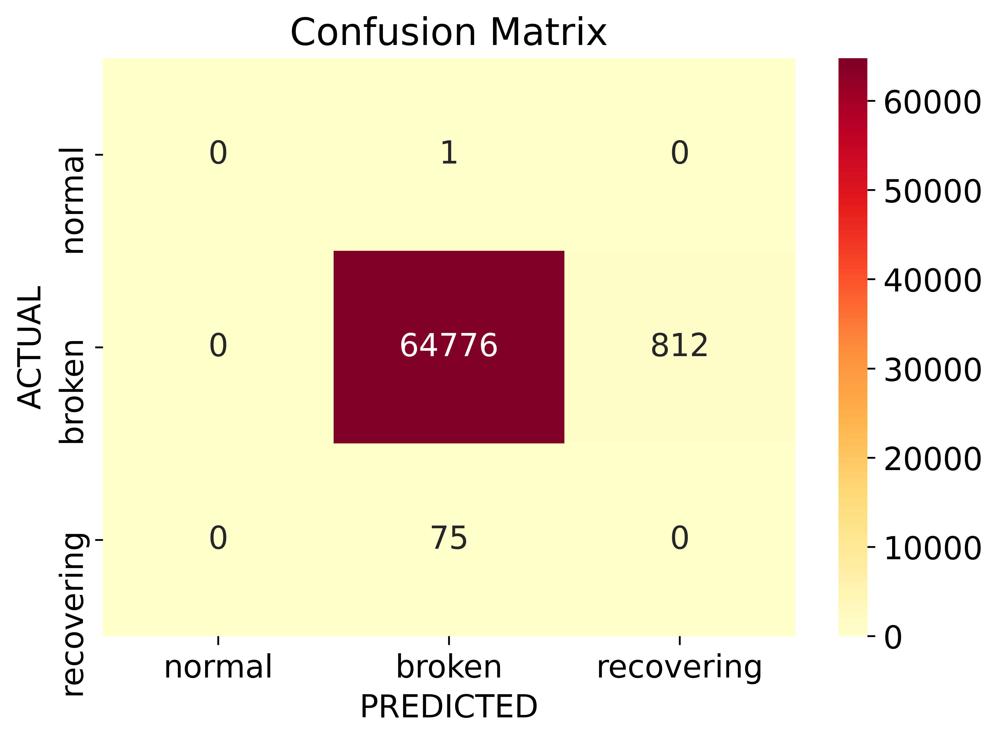


=======================================> PLOTS <=========================================


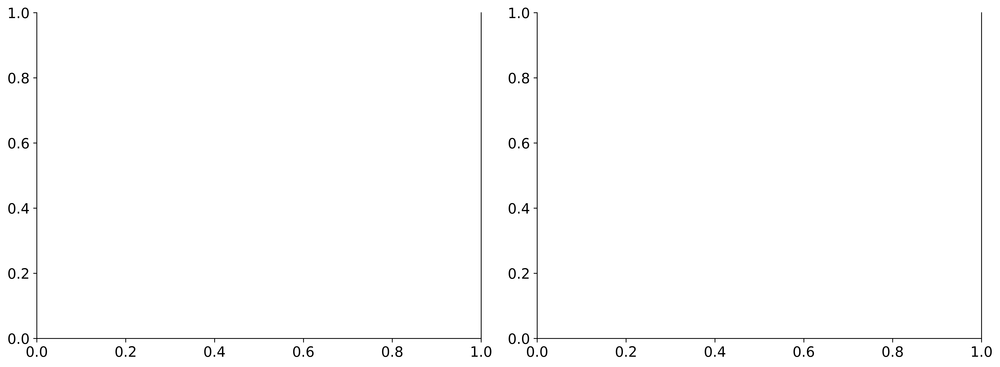

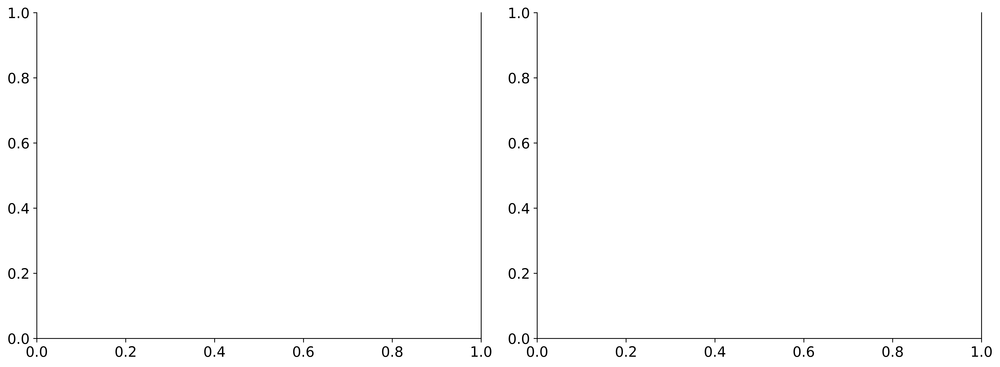

In [50]:
numeric_trans_nb = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('kbn', KBinsDiscretizer(n_bins=35, encode='ordinal'))]) # increaing bins yields better results

categorical_trans_nb = Pipeline(steps=[
    ('ordinal', OrdinalEncoder(dtype=np.int8))]) # np.int8 = 0 to 255, 1 byte. ONLY POSITIVE INTEGERS

## Column Transformer
preprocessor_nb = ColumnTransformer(
    transformers=[
        ('num', numeric_trans_nb, numeric_columns),
        ('cat', categorical_trans_nb, categorical_columns)],
    remainder='passthrough')

## Applying Column Transformer
X_train_nb = preprocessor_nb.fit_transform(X_train_cat)
X_test_nb = preprocessor_nb.transform(X_test_cat)

nb_clf = GaussianNB() # ovr = one vs rest, ovo = one vs one

nb_clf, nb_report = report(nb_clf, X_train_nb, y_train,
                           X_test_nb, y_test, display_scores=[primary_eval_metric], refit=True, confusion_labels=confusion_lbs)

<a id="logistic-regression"></a>
### 5.3.   Logistic Regression

In [51]:
# logit = LogisticRegression(class_weight='balanced',
#                                 max_iter=500, penalty='l1',
#                                 # scoring='f1_weighted', 
#                                 # scoring='f1', 
#                                 solver='liblinear',
#                                 n_jobs=-1, random_state=rng,
#                                 # refit=True,
#                                 verbose=0)

# logit, logit_report = report(logit, X_train, y_train,
#                                 X_test, y_test,
#                                 display_scores=[primary_eval_metric],
#                                 importance_plot=True,
#                                 feature_labels=feature_names,
#                                 confusion_labels=confusion_lbs)

<a id="k-nearest-neighbors"></a>
### 5.4.   K-Nearest Neighbors
KNN estimator in Scikit-learn does not provide a way to pass class-weights to enable cost-sensitive/ class-weighted learning.

In [52]:
# knn = KNeighborsClassifier(n_neighbors=5, p=3, leaf_size=30,
#                            weights='distance', n_jobs=-1) # n_neighbors=5 because 5 classes

# knn, knn_report = report(knn, X_train, y_train,
#                          X_test, y_test,
#                          display_scores=[primary_eval_metric],
#                          importance_plot=True,
#                          feature_labels=feature_names,
#                          confusion_labels=confusion_lbs)

<a id="decision-tree"></a>
### 5.5.   Decision Tree

DecisionTreeClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=9, max_leaf_nodes=2, random_state=777)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 153216 samples
 Test Size: 65664 samples
---------------------------------------------
Training Time: 0.6899630999999999 seconds
 Testing Time: 0.002382199999999557 seconds
---------------------------------------------
Train Accuracy:  0.969702903091061
 Test Accuracy:  0.9880299707602339
---------------------------------------------
Train F1 Score:  0.9711862599366575
 Test F1 Score:  0.9928285107049414

---------------------------------------------
 Area Under ROC (test):  0.49458758938569247
---------------------------------------------
Model Memory Size: 1.564453125 kB

=============================> CLASSIFICATION REPORT <===================================
              precision    recall  f1-score   support

      normal       0.00      0

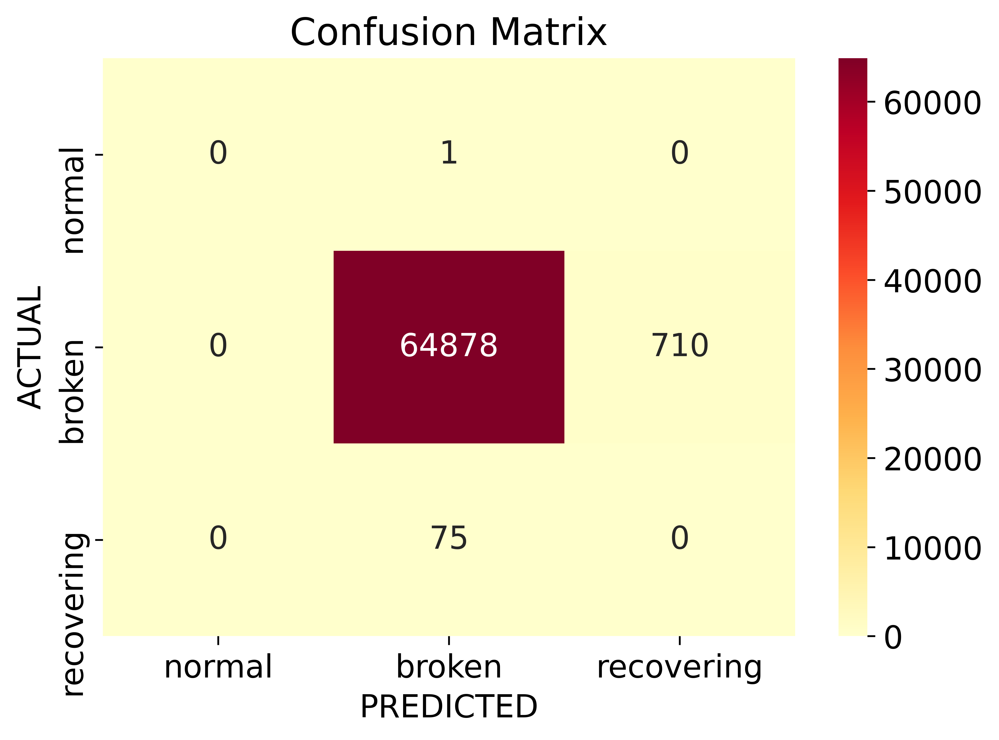


=======================================> PLOTS <=========================================


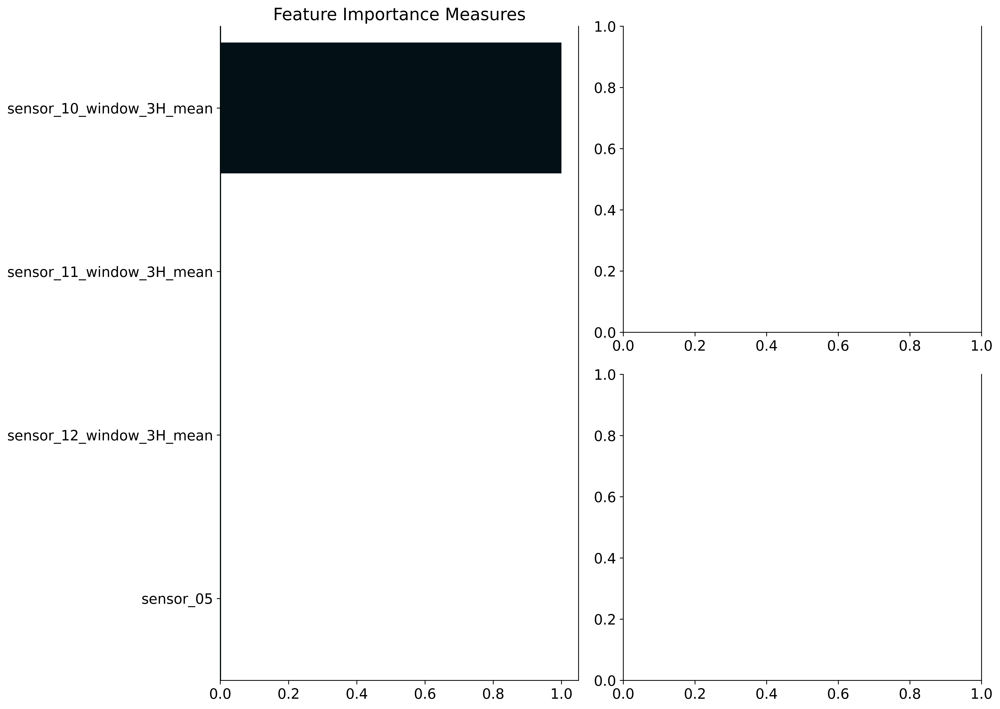

In [53]:
decision_tree = DecisionTreeClassifier(class_weight='balanced',
                                       criterion='entropy',
                                       max_depth=9, 
                                       max_leaf_nodes=2, # lower value helps to avoid overfitting
                                        
                                       # min_samples_split=0.2,
                                       random_state=rng)

decision_tree, decision_tree_report = report(decision_tree, X_train, y_train,
                                             X_test, y_test,
                                             display_scores=[primary_eval_metric],
                                             importance_plot=True,
                                             feature_labels=feature_names,
                                             confusion_labels=confusion_lbs)

<a id="decision-trees-with-bagging"></a>
### 5.6.   Decision Trees with Bagging

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight='balanced',
                                                        criterion='entropy',
                                                        max_depth=9,
                                                        max_leaf_nodes=2,
                                                        random_state=777),
                  n_estimators=100, n_jobs=-1, random_state=777)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 153216 samples
 Test Size: 65664 samples
---------------------------------------------
Training Time: 10.9554836 seconds
 Testing Time: 0.2677897000000016 seconds
---------------------------------------------
Train Accuracy:  0.9696898496240601
 Test Accuracy:  0.9880147417153996
---------------------------------------------
Train F1 Score:  0.9711752857132597
 Test F1 Score:  0.9928208130722092

---------------------------------------------
 Area Unde

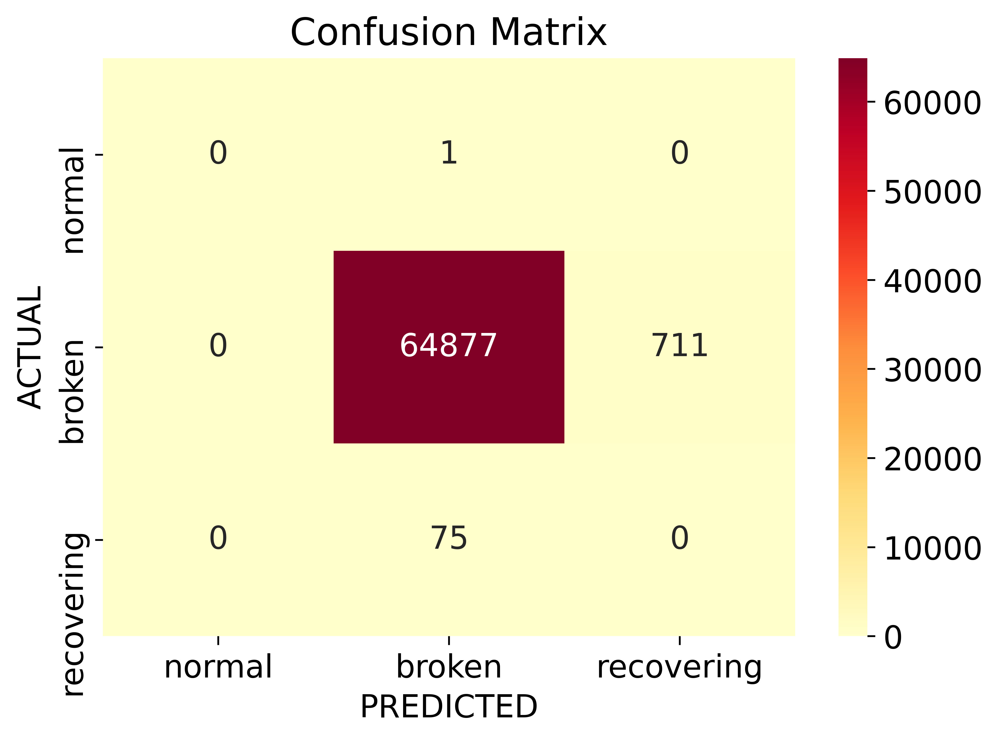


=======================================> PLOTS <=========================================


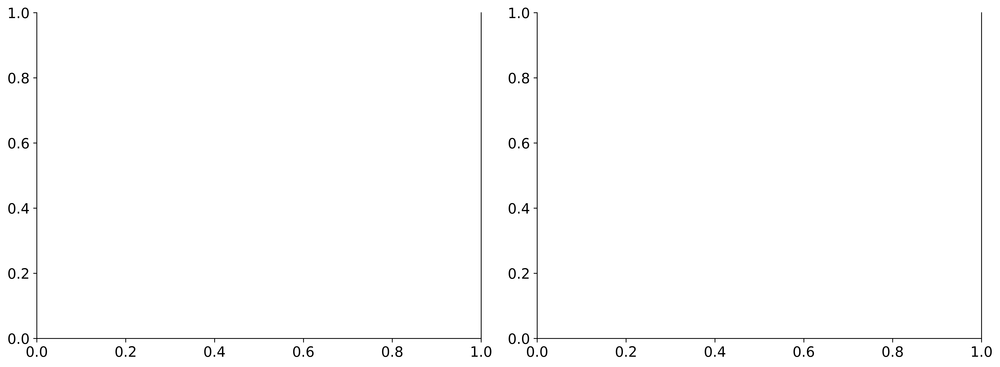

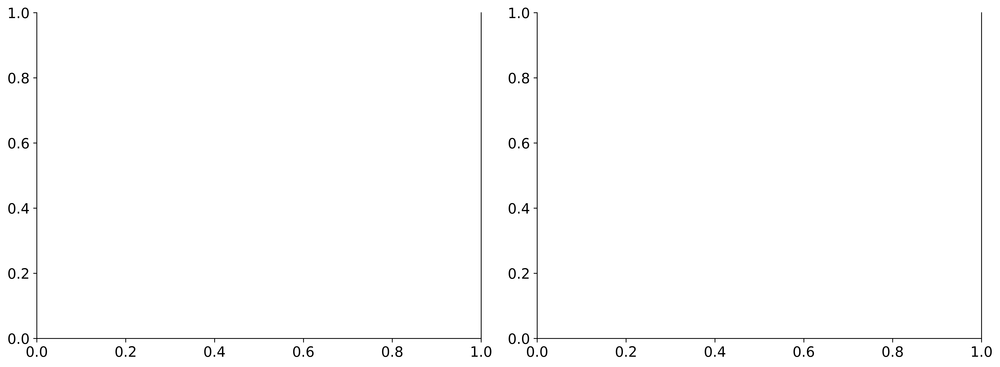

In [54]:
bagging_dtree = DecisionTreeClassifier(class_weight='balanced',
                                       max_depth=9,
                                       max_leaf_nodes=2, # lower value helps to avoid overfitting
                                       criterion='entropy', 
                                       random_state=rng)

bagging_clf = BaggingClassifier(base_estimator=bagging_dtree,
                                # max_samples=0.745, 
                                n_estimators=100,
                                # max_features=0.37,
                                n_jobs=-1, random_state=rng)

bagging_clf, bagging_clf_report = report(bagging_clf, X_train, y_train,
                                         X_test, y_test,
                                         display_scores=[primary_eval_metric],
                                         feature_labels=feature_names,
                                         confusion_labels=confusion_lbs)

<a id="random-forests"></a>
### 5.7.   Random Forests

RandomForestClassifier(class_weight='balanced', criterion='entropy',
                       max_depth=9, max_features=0.2, n_jobs=-1,
                       random_state=777)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 153216 samples
 Test Size: 65664 samples
---------------------------------------------
Training Time: 5.389426 seconds
 Testing Time: 0.1183036000000044 seconds
---------------------------------------------
Train Accuracy:  0.9979310254803676
 Test Accuracy:  0.998766447368421
---------------------------------------------
Train F1 Score:  0.9979402236961622
 Test F1 Score:  0.9989015877312778

---------------------------------------------
 Area Under ROC (test):  0.9360507254385274
---------------------------------------------
Model Memory Size: 1906.283203125 kB

=============================> CLASSIFICATION REPORT <===================================
              precision    recall  f1-score   support

      

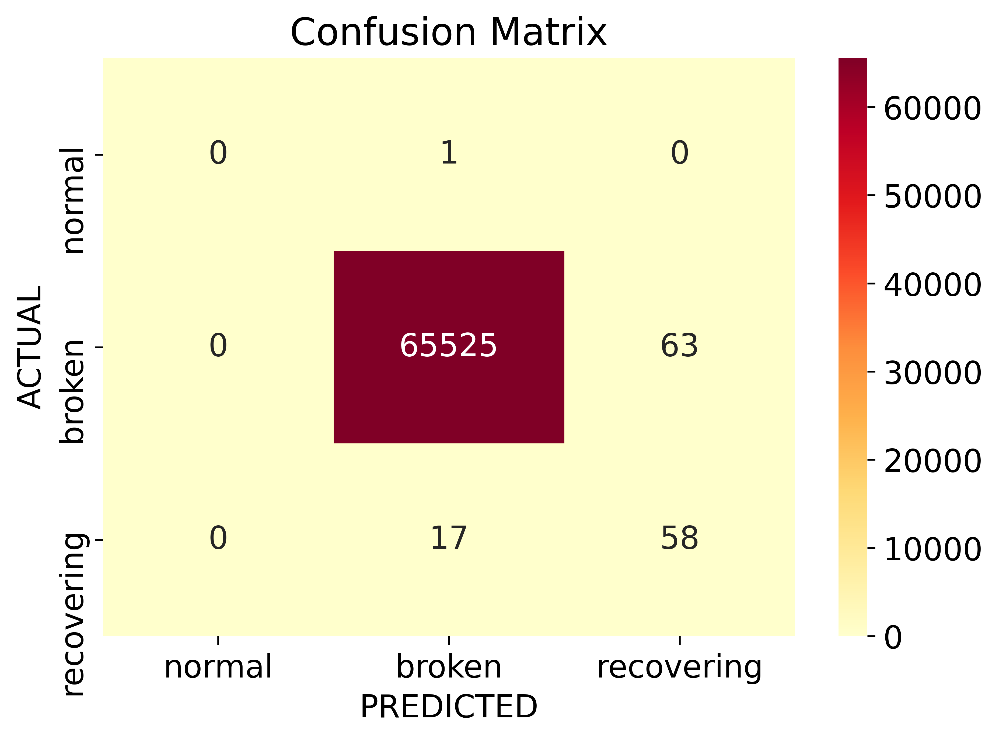


=======================================> PLOTS <=========================================


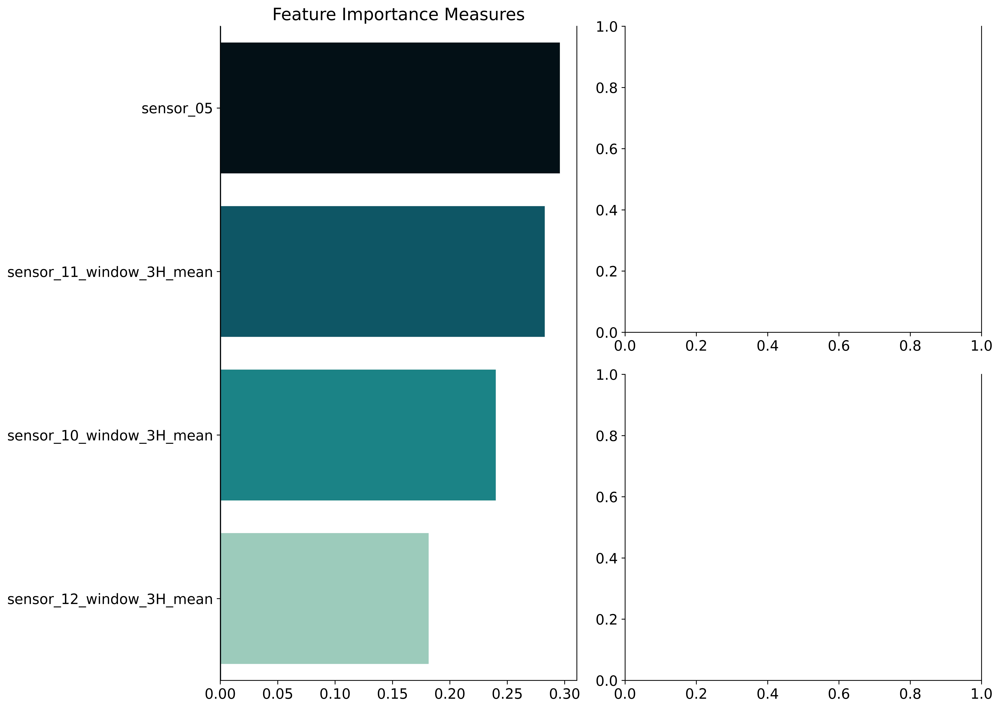

In [55]:
random_forest = RandomForestClassifier(class_weight='balanced', criterion='entropy',
                                       max_depth=9, 
                                       max_features=0.2,
                                       # max_samples=0.63, 
                                       n_estimators=100,
                                       n_jobs=-1, random_state=rng)

random_forest, random_forest_report = report(random_forest, X_train, y_train,
                                             X_test, y_test,
                                             display_scores=[primary_eval_metric],
                                             importance_plot=True,
                                             feature_labels=feature_names,
                                             confusion_labels=confusion_lbs)

<a id="decision-trees-with-adaboost"></a>
### 5.8.   Decision Trees with AdaBoost
The default base estimator for `AdaBoostClassifier` is `DecisionTreeClassifier(max_depth=1)`

AdaBoostClassifier(learning_rate=0.2, n_estimators=100, random_state=777)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 153216 samples
 Test Size: 65664 samples
---------------------------------------------
Training Time: 28.3092178 seconds
 Testing Time: 0.8463591000000008 seconds
---------------------------------------------
Train Accuracy:  0.9511539264828739
 Test Accuracy:  0.9995735867446394
---------------------------------------------
Train F1 Score:  0.9453647220373077
 Test F1 Score:  0.999524896051839

---------------------------------------------
 Area Under ROC (test):  0.969476786663849
---------------------------------------------
Model Memory Size: 67.0634765625 kB

=============================> CLASSIFICATION REPORT <===================================
              precision    recall  f1-score   support

      normal       0.00      0.00      0.00         1
      broken       1.00      1.00      1.00     65588

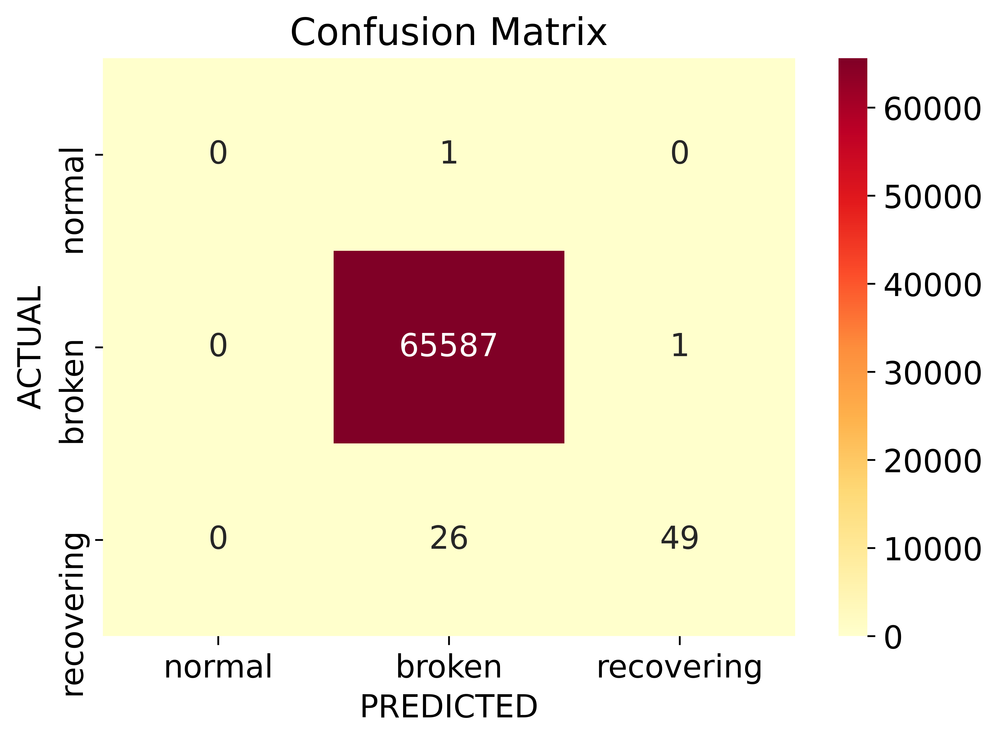


=======================================> PLOTS <=========================================


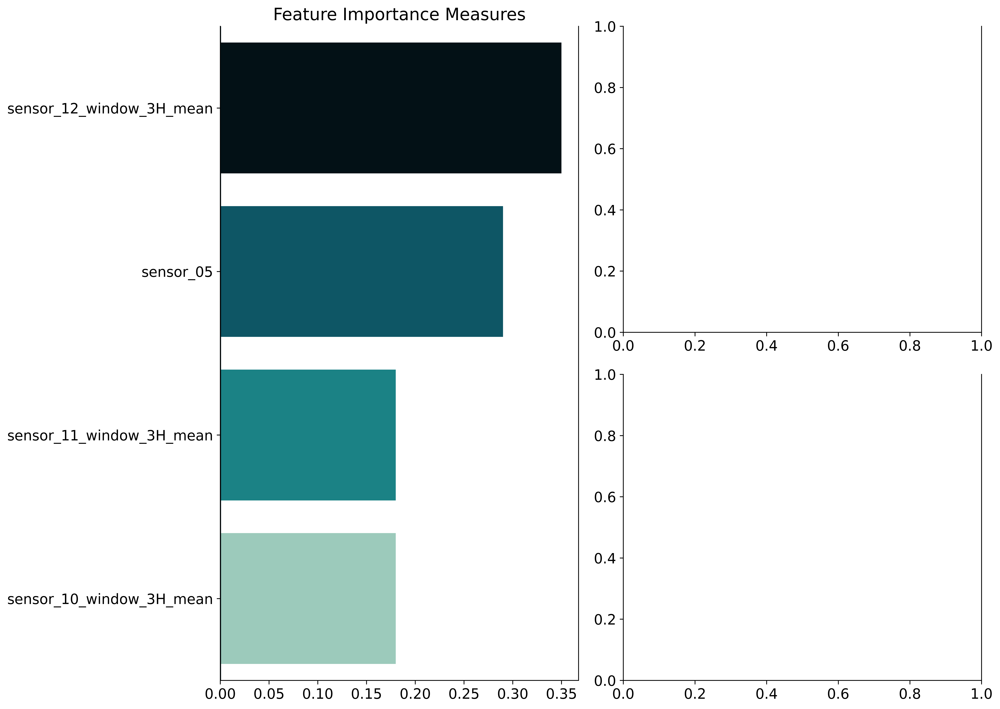

In [56]:
adaboot = AdaBoostClassifier(
n_estimators=100, 
# n_estimators=57, 
learning_rate=0.2,
# learning_rate=0.064,
random_state=rng)

adaboot, adaboot_report = report(adaboot, X_train, y_train,
                                 X_test, y_test,
                                 display_scores=[primary_eval_metric],
                                 importance_plot=True,
                                 feature_labels=feature_names,
                                 confusion_labels=confusion_lbs)

<a id="linear-svc"></a>
### 5.9.   Linear SVC

In [57]:
# linear_svc = SVC(C=2.1, kernel='linear', probability=True,
#                  decision_function_shape='ovr', # for multi-class classification
#                  class_weight='balanced', random_state=rng)

# linear_svc, linear_svc_report = report(linear_svc, X_train, y_train,
#                                        X_test, y_test,
#                                        display_scores=[primary_eval_metric],
#                                        importance_plot=True,
#                                        feature_labels=feature_names,
#                                        confusion_labels=confusion_lbs)

<a id="svm-with-rbf-kernel"></a>
### 5.10.   SVM with RBF kernel

In [58]:
# rbf_svc = SVC(C=0.20, kernel='rbf',
#             #   max_iter=100,
#               probability=True,
#               decision_function_shape='ovr', # for multi-class classification
#               class_weight='balanced', random_state=rng)

# rbf_svc, rbf_svc_report = report(rbf_svc, X_train, y_train,
#                                  X_test, y_test,
#                                  display_scores=[primary_eval_metric],
#                                  importance_plot=True,
#                                  feature_labels=feature_names,
#                                  confusion_labels=confusion_lbs)

<a id="xgboost"></a>
### 5.11.   XGBoost

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.002, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=-1,
              num_class=array([0, 1, 2]), num_parallel_tree=None, ...)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 153216 samples
 Test Size: 65664 samples
---------------------------------------------
Training Time: 0 seconds
 Testing Time: 0.06940

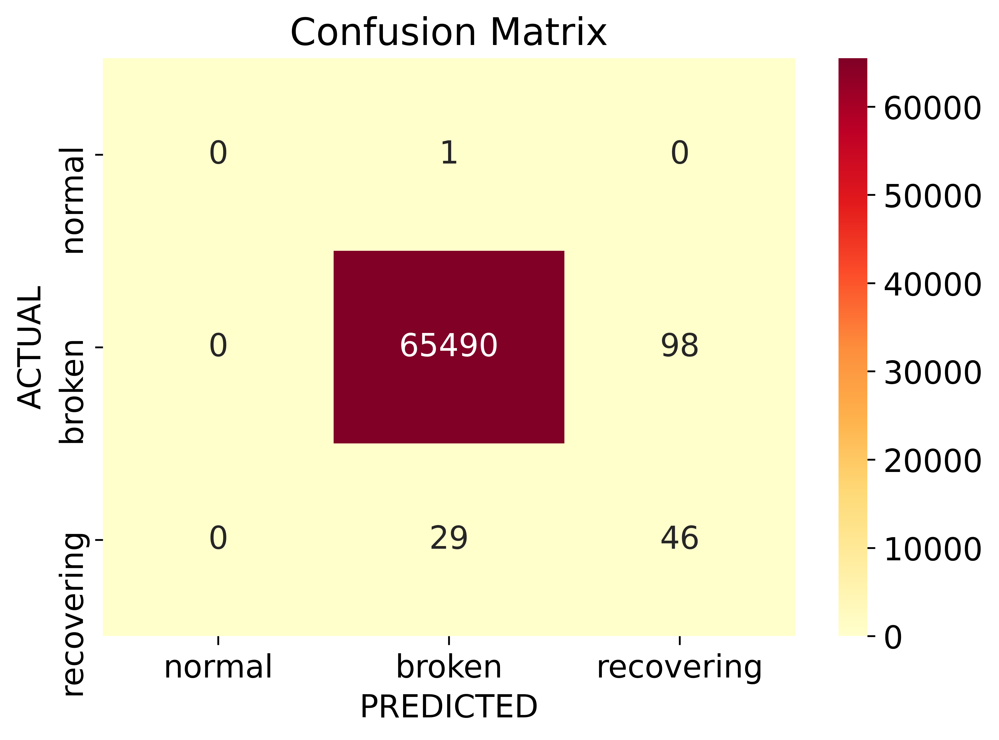


=======================================> PLOTS <=========================================


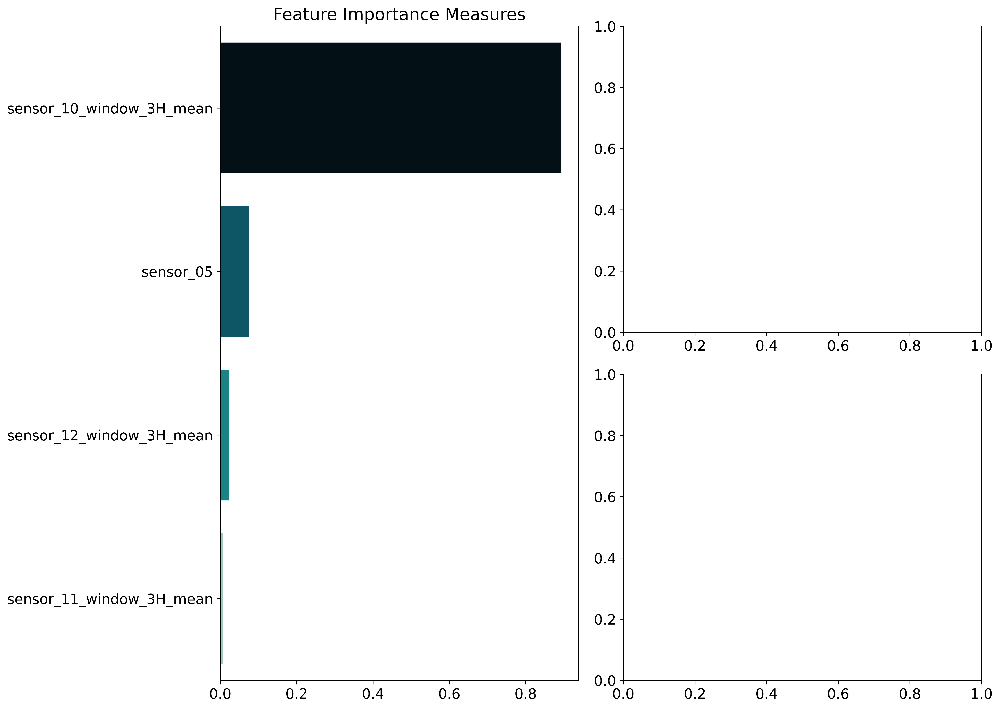

In [59]:
# cls_weight = (y_train.shape[0] - np.sum(y_train)) / np.sum(y_train)

cls_weight = compute_class_weight(class_weight='balanced',
                                    classes=np.unique(y_train),
                                    y=y_train)

params = {
    'learning_rate': 0.002,
    # 'learning_rate': 0.014724527414939945,
        #   'num_boost_round': 3451,
        #   'gamma': 0.4074467665676125,
        #   'reg_lambda': 31.082862686792716,
        #   'reg_alpha': 0.008543705214252668,
        #   'max_depth': 7,
          'max_depth': 5,
        #   'min_child_weight': 3.2435633342899867e-06,
        #   'subsample': 0.15432895096353877,
        #   'colsample_bytree': 0.7665394913603492
          }

xgb_clf = XGBClassifier(objective="multi:softmax", num_class=np.unique(y_train),
    **params, 
                        # scale_pos_weight=cls_weight,
                        random_state=rng, n_jobs=-1)
xgb_clf.fit(X_train, y_train);

xgb_clf, xgb_report = report(xgb_clf, X_train, y_train,
                             X_test, y_test,
                             display_scores=[primary_eval_metric],
                             importance_plot=True,
                             feature_labels=feature_names,
                             confusion_labels=confusion_lbs)

<a id="lightgbm"></a>
### 5.12.   LightGBM
LightGBM is similar to XGBoost but grows the trees in the ensemble based on Leaf-wise growth algorithm unlike Level-wise algorithm in XGBoost.

LGBMClassifier(bagging_fraction=0.4, bagging_freq=3, class_weight='balanced',
               feature_fraction=0.5, learning_rate=0.04, n_jobs=-1,
               objective='multiclass', random_state=777, verbose=-1)

=============================> TRAIN-TEST DETAILS <======================================
Train Size: 153216 samples
 Test Size: 65664 samples
---------------------------------------------
Training Time: 0 seconds
 Testing Time: 0.1673386000000079 seconds
---------------------------------------------
Train Accuracy:  0.9964168233082706
 Test Accuracy:  0.9989187378167641
---------------------------------------------
Train F1 Score:  0.9964715891437027
 Test F1 Score:  0.9986115280571439

---------------------------------------------
 Area Under ROC (test):  0.9055350706042798
---------------------------------------------
Model Memory Size: 1015.1728515625 kB

=============================> CLASSIFICATION REPORT <===================================
              precision   

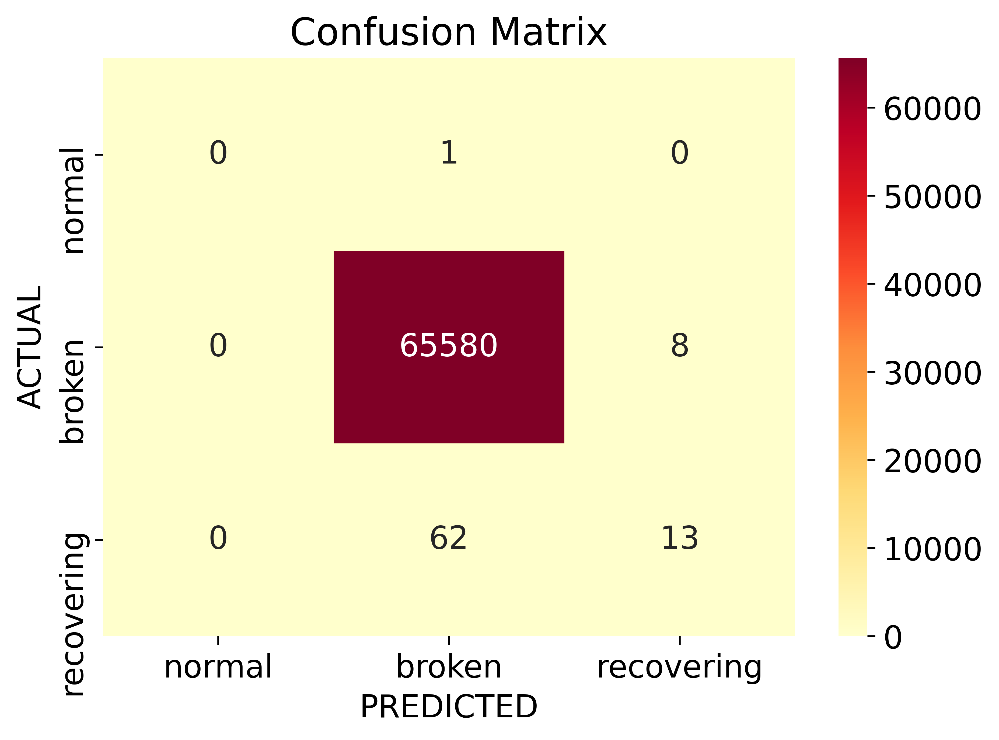


=======================================> PLOTS <=========================================


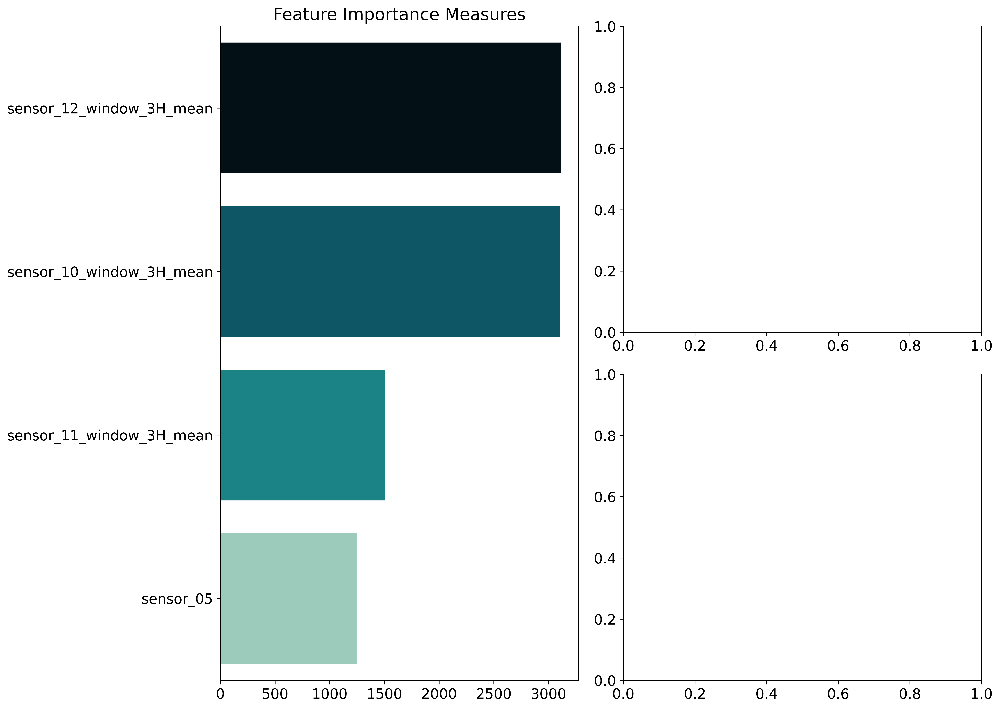

In [60]:
params = {
    'objective': 'multiclass',
    'learning_rate': 0.04,
    'verbose': -1, 
    # 'lambda_l1': 0.0, 
    # 'lambda_l2': 0.0, 
    # 'num_leaves': 31, 
    'feature_fraction': 0.5, # lower value helps to avoid overfitting
    'bagging_fraction': 0.4, # lower value helps to avoid overfitting
    'bagging_freq': 3, # lower value helps to avoid overfitting
    # 'min_child_samples': 20
          }

lgbm_clf = LGBMClassifier(
    **params, 
    class_weight='balanced',
    n_estimators=100,
    random_state=rng, n_jobs=-1)
lgbm_clf.fit(X_train, y_train);

lgbm_clf, lgbm_report = report(lgbm_clf, X_train, y_train,
                               X_test, y_test,
                               display_scores=[primary_eval_metric],
                               importance_plot=True,
                               feature_labels=feature_names,
                               confusion_labels=confusion_lbs)

<a id="catboost"></a>
### 5.13.   CatBoost
Cat boost performs better without One-hot encoding because it performs an internal categorical encoding that is similar to Leave One Out Encoding (LOOE). So, we can give the dataframe as input to the catboost classifier.

0:	learn: 0.3333333	test: 0.3333333	best: 0.3333333 (0)	total: 24.8ms	remaining: 2.45s
1:	learn: 0.3333333	test: 0.3333333	best: 0.3333333 (0)	total: 43.1ms	remaining: 2.11s
2:	learn: 0.3333333	test: 0.3333333	best: 0.3333333 (0)	total: 64.1ms	remaining: 2.07s
3:	learn: 0.3333333	test: 0.3333333	best: 0.3333333 (0)	total: 84.9ms	remaining: 2.04s
4:	learn: 0.3333333	test: 0.3333333	best: 0.3333333 (0)	total: 107ms	remaining: 2.02s
5:	learn: 0.6023349	test: 0.6023349	best: 0.6023349 (5)	total: 130ms	remaining: 2.04s
6:	learn: 0.6023349	test: 0.6023349	best: 0.6023349 (5)	total: 151ms	remaining: 2s
7:	learn: 0.6023349	test: 0.6023349	best: 0.6023349 (5)	total: 169ms	remaining: 1.95s
8:	learn: 0.6023349	test: 0.6023349	best: 0.6023349 (5)	total: 187ms	remaining: 1.9s
9:	learn: 0.6023349	test: 0.6023349	best: 0.6023349 (5)	total: 207ms	remaining: 1.86s
10:	learn: 0.6023349	test: 0.6023349	best: 0.6023349 (5)	total: 236ms	remaining: 1.91s
11:	learn: 0.6731275	test: 0.6731275	best: 0.6731275 

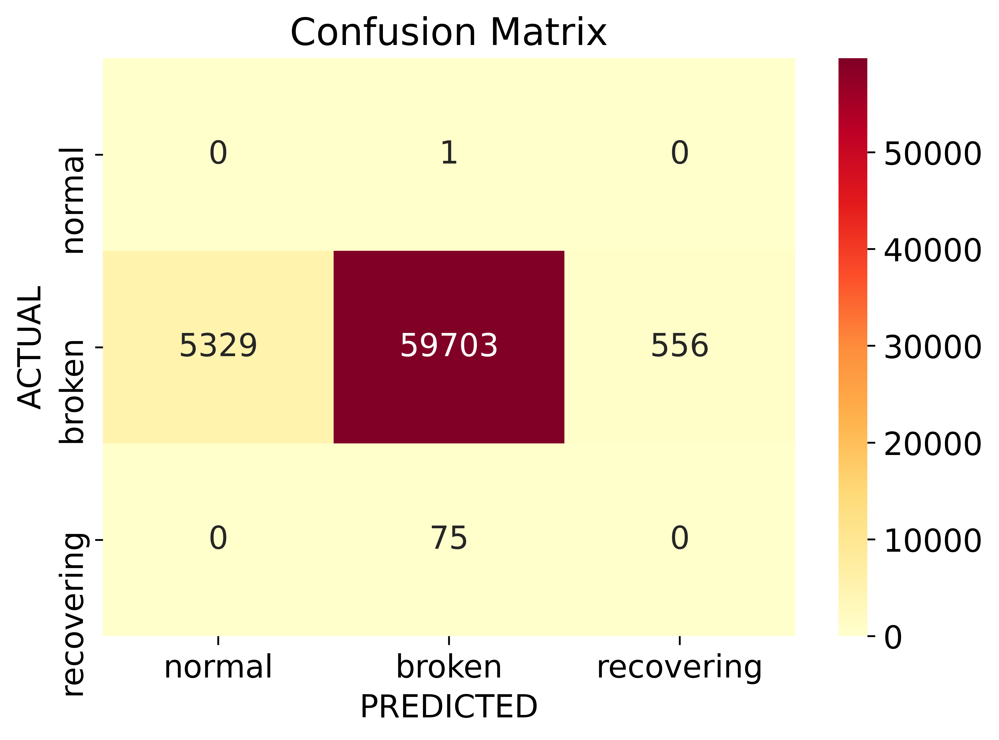


=======================================> PLOTS <=========================================


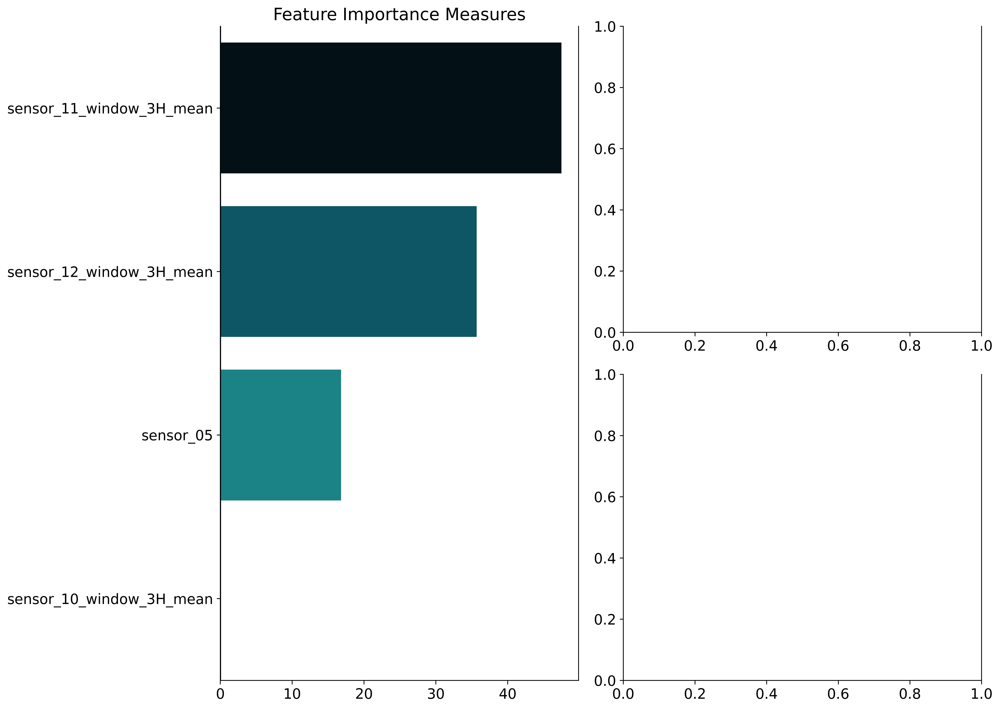

In [101]:
params = {
'verbose': -1,
}

catboost_clf = CatBoostClassifier(
**params,
cat_features=categorical_columns,
loss_function='MultiClass', # for multi-class classification
# loss_function='MultiClass', # for multi-class classification
# l2_leaf_reg=120,
depth=5,
colsample_bylevel=0.03, # lower value helps to avoid overfitting
auto_class_weights='Balanced',
iterations=100, 
learning_rate=0.01,
use_best_model=True,
early_stopping_rounds=15,
eval_metric='Accuracy', 
#   eval_metric='F1', 
#   custom_metric='weighted_f1_score', # for multi-class classification
random_state=rng
)

catboost_clf.fit(X_train_cat, y_train, 
                 eval_set=(X_train_cat, y_train),
                 verbose=True)

f_labels = categorical_columns+numeric_columns
catboost_clf, catboost_report = report(catboost_clf, X_train_cat, y_train,
                                       X_test_cat, y_test,
                                       display_scores=[primary_eval_metric],
                                       importance_plot=True,
                                       feature_labels=f_labels,
                                       confusion_labels=confusion_lbs)

<a id="artificial-neural-networks"></a>
### 5.14 Artificial Neural Networks

In [62]:
tf.debugging.disable_traceback_filtering()

CLASS_WEIGHT = compute_class_weight(class_weight='balanced',
                                    classes=np.unique(y_train),
                                    y=y_train)
CLASS_WEIGHT = dict(enumerate(CLASS_WEIGHT)) # for multi-class classification

BATCHSIZE = X_train.shape[0]
FEATURES = X_train.shape[1]
CLASSES = len(confusion_lbs) # for multi-class classification
EPOCHS = 1000
N_TRAIN_EXAMPLES = X_train.shape[0]
STEPS_PER_EPOCH = N_TRAIN_EXAMPLES // BATCHSIZE

In [63]:
# from keras.utils import to_categorical

# # Convert your integer labels to one-hot encoded labels
# y_train = to_categorical(y_train, num_classes=len(confusion_lbs))
# y_test = to_categorical(y_test, num_classes=len(confusion_lbs))

#### NN

In [64]:
tf.keras.backend.clear_session()

In [65]:
modelNN = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(FEATURES,)), # input layer
    tf.keras.layers.BatchNormalization(), # batch normalization layer
    tf.keras.layers.Dense(16, activation='relu',
                                 kernel_initializer=tf.keras.initializers.GlorotUniform(seed=rng),
                                 kernel_regularizer=tf.keras.regularizers.l1_l2(l1=0.001, l2=0.001), # Elastic Net regularization
                                 use_bias=True), # dense layer
    tf.keras.layers.BatchNormalization(), # batch normalization layer
    tf.keras.layers.Dense(2, activation='relu'), # dense layer
    # tf.keras.layers.BatchNormalization(), # batch normalization layer
    # tf.keras.layers.Dense(8, activation='relu'), # dense layer
    tf.keras.layers.Dropout(0.1, seed=rng), # 
    tf.keras.layers.Dense(CLASSES, activation='softmax') # output shape is num classes, activation is softmax
])

modelNN.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.02),
                # loss="categorical_crossentropy",
              loss="sparse_categorical_crossentropy",
              # loss="binary_crossentropy",
                metrics=['accuracy'])

modelNN.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization (BatchN  (None, 4)                16        
 ormalization)                                                   
                                                                 
 dense (Dense)               (None, 16)                80        
                                                                 
 batch_normalization_1 (Batc  (None, 16)               64        
 hNormalization)                                                 
                                                                 
 dense_1 (Dense)             (None, 2)                 34        
                                                                 
 dropout (Dropout)           (None, 2)                 0         
                                                                 
 dense_2 (Dense)             (None, 3)                 9

In [66]:
# # See the inputs and outputs of each layer
# plot_model(
#     modelNN, 
#     to_file='./Assets/Model_Architecture/modelNN.png',
#     show_shapes=True,
#     show_dtype=True,
#     show_layer_names=True,
#     rankdir='TB',
#     expand_nested=False,
#     dpi=600,
#     layer_range=None,
#     show_layer_activations=True
#     # show_trainable=True # after tf 2.10
# )

In [67]:
# visualkeras.layered_view(modelNN, legend=True, to_file='./Assets/Model_Architecture/vsk-modelNN.png').show()

# ann_viz(model=modelNN, view=True, filename="./Assets/Model_Architecture/vsk-modelNN.gv", title="Neural Network")

In [68]:
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

X_train shape: (153216, 4)
y_train shape: (153216,)
X_test shape: (65664, 4)
y_test shape: (65664,)


In [69]:
# Callbacks for NNs
earlystopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', # stop training when the validation loss increases
    # min_delta = 1e-3, # 0.001
    patience = 30,
    mode = 'auto',
    restore_best_weights = True,
    verbose=1
)

checkpointer_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath = '../../code/pump/models/modelNN/modelNN-{epoch:02d}-{val_loss:.6f}-{val_accuracy:.6f}.h5',
    monitor = 'val_loss', 
    save_format='h5',
    overwrite=True,
    save_best_only = True,
    save_weights_only = False,
    mode = 'auto',
    verbose = 1,
)

nn_callback = [earlystopping_callback, checkpointer_callback]
# to read saved model
# saved_model = load_model('model_name.hdf5')

Epoch 1/1000
1/1 [==============================] - ETA: 0s - loss: 1.3952 - accuracy: 0.0383
Epoch 1: val_loss improved from inf to 1.46664, saving model to ../../code/pump/models/modelNN\modelNN-01-1.466637-0.011803.h5
1/1 [==============================] - 2s 2s/step - loss: 1.3952 - accuracy: 0.0383 - val_loss: 1.4666 - val_accuracy: 0.0118
Epoch 2/1000
1/1 [==============================] - ETA: 0s - loss: 1.2457 - accuracy: 0.2519
Epoch 2: val_loss improved from 1.46664 to 1.20135, saving model to ../../code/pump/models/modelNN\modelNN-02-1.201346-0.110228.h5
1/1 [==============================] - 0s 88ms/step - loss: 1.2457 - accuracy: 0.2519 - val_loss: 1.2013 - val_accuracy: 0.1102
Epoch 3/1000
1/1 [==============================] - ETA: 0s - loss: 1.0805 - accuracy: 0.3230
Epoch 3: val_loss improved from 1.20135 to 1.06804, saving model to ../../code/pump/models/modelNN\modelNN-03-1.068044-0.901133.h5
1/1 [==============================] - 0s 85ms/step - loss: 1.0805 - accura

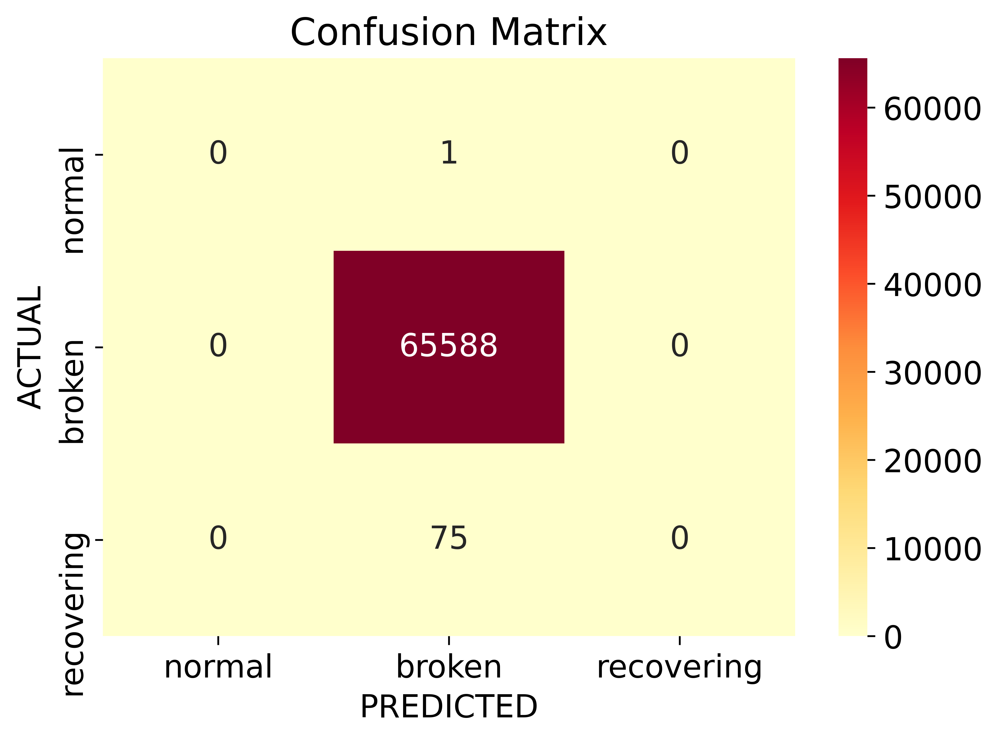


=======================================> PLOTS <=========================================


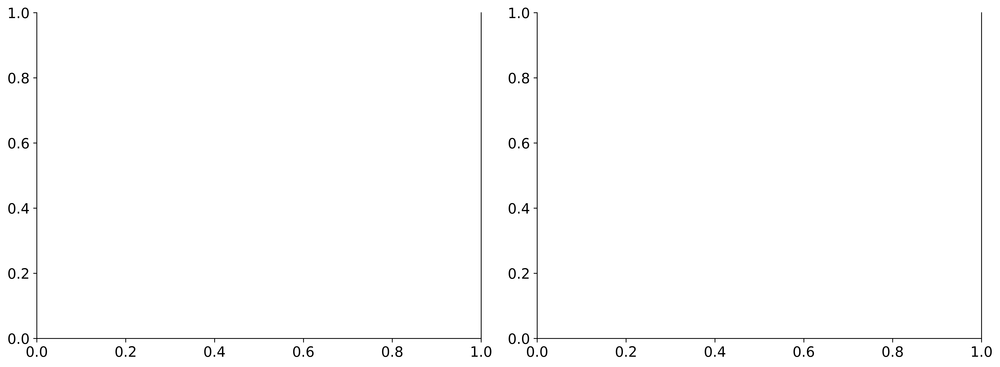

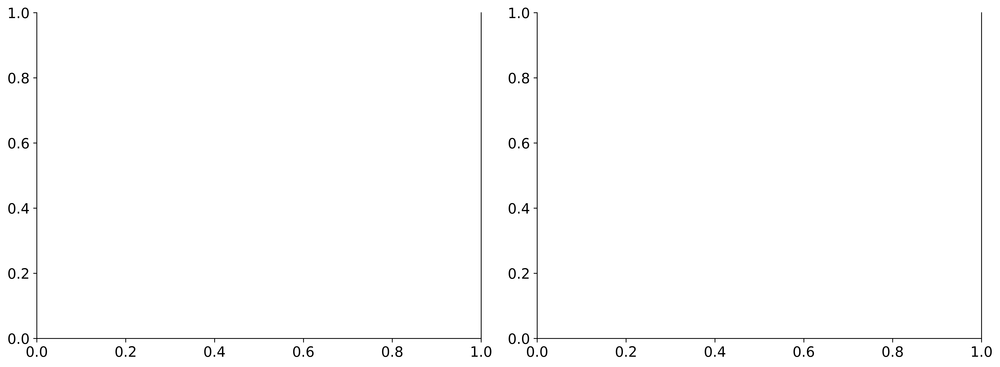

In [70]:
nn_history = modelNN.fit(x=X_train, y=y_train,
                    batch_size=BATCHSIZE,
                    epochs=EPOCHS,
                    verbose=1,
                    callbacks=nn_callback,
                    validation_data=(X_test, y_test),
                    shuffle=False,
                    class_weight=CLASS_WEIGHT,
                    steps_per_epoch=STEPS_PER_EPOCH,
                    use_multiprocessing=True)

_, nn_report = report(modelNN, X_train, y_train,
                      X_test, y_test,
                    #   display_scores=[metrics.accuracy_score],
                      display_scores=[primary_eval_metric],
                      confusion_labels=confusion_lbs,
                      neural_net=True)

#### BiRNN-LSTM

In [71]:
tf.keras.backend.clear_session()

In [72]:
bi_rnn_lstm_modelNN = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(FEATURES,)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape((1, FEATURES)),  # Reshape for LSTM input
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(8, activation='tanh', 
                                                       # tanh activation to use cuDNN
                                                       kernel_initializer=tf.keras.initializers.GlorotUniform(seed=rng),
                                                       kernel_regularizer=tf.keras.regularizers.l1_l2(l1=0.001, l2=0.001), # Elastic Net regularization
                                                       use_bias=True,
                                                       return_sequences=True)), # returns timesteps as well, so 3 dims
    # tf.keras.layers.BatchNormalization(), # batch normalization layer
    # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(8, activation='tanh', 
    #                                                    # tanh activation to use cuDNN
    #                                                    return_sequences=True)),
    tf.keras.layers.BatchNormalization(), # batch normalization layer
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(1, activation='tanh', 
                                                       # tanh activation to use cuDNN
                                                       return_sequences=False)), # does not return timesteps, so 2 dims, last bidirectional layer must return_sequences=False
    
    tf.keras.layers.Dropout(0.1, seed=rng),
    tf.keras.layers.Dense(CLASSES, activation='softmax')
])
bi_rnn_lstm_modelNN.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.02),
              loss="sparse_categorical_crossentropy",
                metrics=['accuracy'])

bi_rnn_lstm_modelNN.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization (BatchN  (None, 4)                16        
 ormalization)                                                   
                                                                 
 reshape (Reshape)           (None, 1, 4)              0         
                                                                 
 bidirectional (Bidirectiona  (None, 1, 16)            832       
 l)                                                              
                                                                 
 batch_normalization_1 (Batc  (None, 1, 16)            64        
 hNormalization)                                                 
                                                                 
 bidirectional_1 (Bidirectio  (None, 2)                144       
 nal)                                                   

In [73]:
# # See the inputs and outputs of each layer
# plot_model(
#     bi_rnn_lstm_modelNN, 
#     to_file='./Assets/Model_Architecture/bi_rnn_lstm_modelNN.png',
#     show_shapes=True,
#     show_dtype=True,
#     show_layer_names=True,
#     rankdir='TB',
#     expand_nested=False,
#     dpi=600,
#     layer_range=None,
#     show_layer_activations=True
#     # show_trainable=True # after tf 2.10
# )

In [74]:
# visualkeras.layered_view(bi_rnn_lstm_modelNN, legend=True, to_file='./Assets/Model_Architecture/bi_rnn_lstm_modelNN.png').show()

In [75]:
# Callbacks for NNs
earlystopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', # stop training when the validation loss increases
    # min_delta = 1e-3, # 0.001
    patience = 30,
    mode = 'auto',
    restore_best_weights = True,
    verbose=1
)

checkpointer_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath = '../../code/pump/models/bi_rnn_lstm_modelNN/bi_rnn_lstm_modelNN-{epoch:02d}-{val_loss:.6f}-{val_accuracy:.6f}.h5',
    monitor = 'val_loss', 
    save_format='h5',
    overwrite=True,
    save_best_only = True,
    save_weights_only = False,
    mode = 'auto',
    verbose = 1,
)

bi_rnn_lstm_modelNN_callback = [earlystopping_callback, checkpointer_callback]
# to read saved model
# saved_model = load_model('model_name.hdf5')

Epoch 1/1000
1/1 [==============================] - ETA: 0s - loss: 1.2957 - accuracy: 0.2825
Epoch 1: val_loss improved from inf to 1.12238, saving model to ../../code/pump/models/bi_rnn_lstm_modelNN\bi_rnn_lstm_modelNN-01-1.122378-0.996345.h5
1/1 [==============================] - 11s 11s/step - loss: 1.2957 - accuracy: 0.2825 - val_loss: 1.1224 - val_accuracy: 0.9963
Epoch 2/1000
1/1 [==============================] - ETA: 0s - loss: 1.2015 - accuracy: 0.3885
Epoch 2: val_loss improved from 1.12238 to 1.09659, saving model to ../../code/pump/models/bi_rnn_lstm_modelNN\bi_rnn_lstm_modelNN-02-1.096591-0.999391.h5
1/1 [==============================] - 0s 263ms/step - loss: 1.2015 - accuracy: 0.3885 - val_loss: 1.0966 - val_accuracy: 0.9994
Epoch 3/1000
1/1 [==============================] - ETA: 0s - loss: 1.1300 - accuracy: 0.4852
Epoch 3: val_loss improved from 1.09659 to 1.07823, saving model to ../../code/pump/models/bi_rnn_lstm_modelNN\bi_rnn_lstm_modelNN-03-1.078225-0.998843.h5


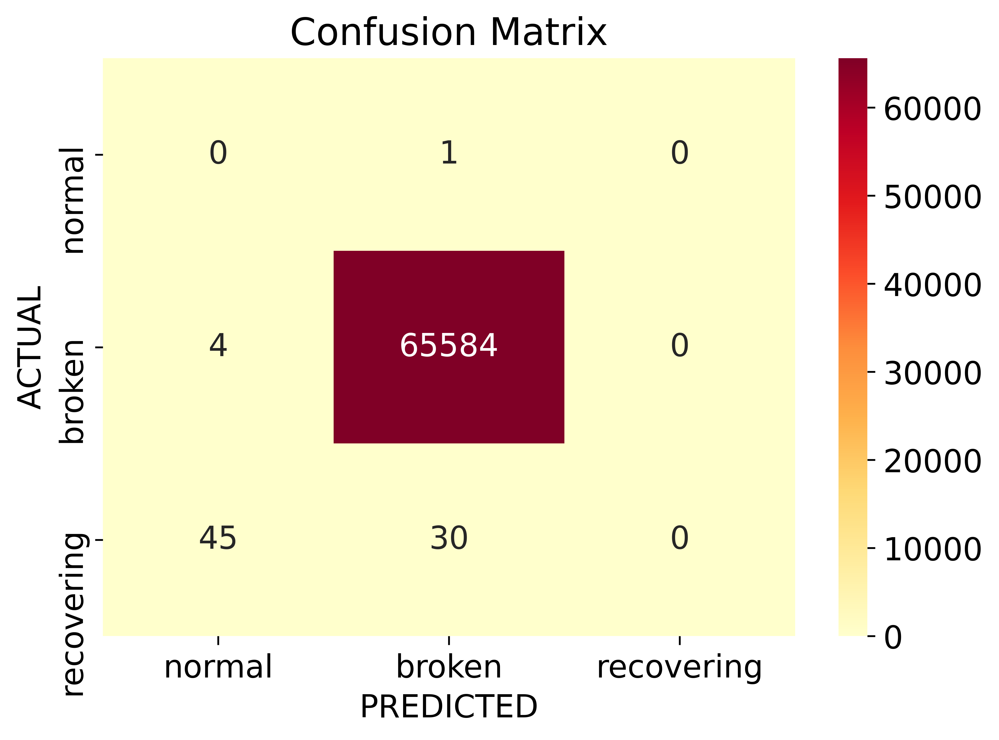


=======================================> PLOTS <=========================================


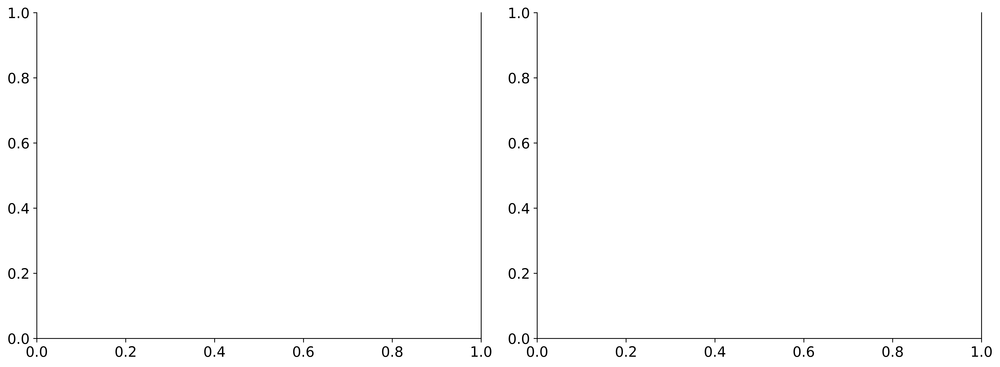

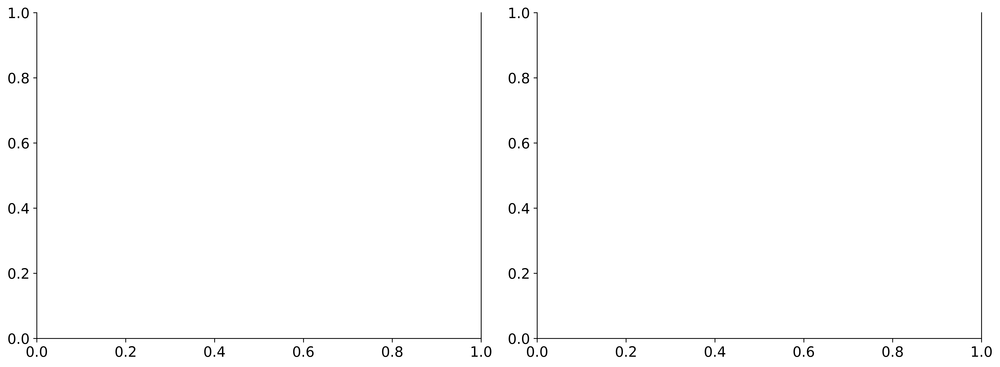

In [76]:
bi_rnn_lstm_nn_history = bi_rnn_lstm_modelNN.fit(x=X_train, y=y_train,
                    batch_size=BATCHSIZE,
                    epochs=EPOCHS,
                    verbose=1,
                    callbacks=bi_rnn_lstm_modelNN_callback,
                    validation_data=(X_test, y_test),
                    shuffle=False,
                    class_weight=CLASS_WEIGHT,
                    steps_per_epoch=STEPS_PER_EPOCH,
                    use_multiprocessing=True)

_, bi_rnn_lstm_nn_report = report(bi_rnn_lstm_modelNN, X_train, y_train,
                      X_test, y_test,
                    #   display_scores=[metrics.accuracy_score],
                      display_scores=[primary_eval_metric],
                      confusion_labels=confusion_lbs,
                      neural_net=True)

#### CNN

In [77]:
tf.keras.backend.clear_session()

In [78]:
modelCNN = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(FEATURES,)),
    tf.keras.layers.BatchNormalization(), # batch normalization layer    
    tf.keras.layers.Reshape((FEATURES, 1)),  # Reshape input data for Conv1D
    tf.keras.layers.Conv1D(2, 3, activation='relu', padding='same',
                           kernel_initializer=tf.keras.initializers.GlorotUniform(seed=rng),
                           kernel_regularizer=tf.keras.regularizers.l1_l2(l1=0.001, l2=0.001), # Elastic Net regularization
                           use_bias=True),  # Add Conv1D layer
    tf.keras.layers.MaxPooling1D(2),  # Add MaxPooling1D layer
    tf.keras.layers.BatchNormalization(), # batch normalization layer
    tf.keras.layers.Conv1D(1, 3, activation='relu', padding='same'),  # Add another Conv1D layer
    tf.keras.layers.MaxPooling1D(2),  # Add another MaxPooling1D layer
    # tf.keras.layers.BatchNormalization(), # batch normalization layer
    # tf.keras.layers.Conv1D(8, 3, activation='relu', padding='same'),  # Add another Conv1D layer
    # tf.keras.layers.MaxPooling1D(2),  # Add another MaxPooling1D layer
    tf.keras.layers.Flatten(),  # flatten the output of the last pooling layer so it can be fed into dense layers
    tf.keras.layers.Dropout(0.1, seed=rng), # 
    tf.keras.layers.Dense(CLASSES, activation='softmax') # output shape is num classes, activation is softmax
])

modelCNN.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.02),
              loss="sparse_categorical_crossentropy",
                metrics=['accuracy'])

modelCNN.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization (BatchN  (None, 4)                16        
 ormalization)                                                   
                                                                 
 reshape (Reshape)           (None, 4, 1)              0         
                                                                 
 conv1d (Conv1D)             (None, 4, 2)              8         
                                                                 
 max_pooling1d (MaxPooling1D  (None, 2, 2)             0         
 )                                                               
                                                                 
 batch_normalization_1 (Batc  (None, 2, 2)             8         
 hNormalization)                                                 
                                                        

In [79]:
# # See the inputs and outputs of each layer
# plot_model(
#     modelCNN, 
#     to_file='./Assets/Model_Architecture/modelNN.png',
#     show_shapes=True,
#     show_dtype=True,
#     show_layer_names=True,
#     rankdir='TB',
#     expand_nested=False,
#     dpi=600,
#     layer_range=None,
#     show_layer_activations=True
#     # show_trainable=True # after tf 2.10
# )

In [80]:
# visualkeras.layered_view(modelCNN, legend=True, to_file='./Assets/Model_Architecture/modelNN.png').show()

In [81]:
# Callbacks for NNs
earlystopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', # stop training when the validation loss increases
    # min_delta = 1e-3, # 0.001
    patience = 30,
    mode = 'auto',
    restore_best_weights = True,
    verbose=1
)

checkpointer_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath = '../../code/pump/models/modelCNN/modelCNN-{epoch:02d}-{val_loss:.6f}-{val_accuracy:.6f}.h5',
    monitor = 'val_loss',
    save_format='h5',
    overwrite=True,
    save_best_only = True,
    save_weights_only = False,
    mode = 'auto',
    verbose = 1,
)

modelCNN_callback = [earlystopping_callback, checkpointer_callback]
# to read saved model
# saved_model = load_model('model_name.hdf5')

Epoch 1/1000
1/1 [==============================] - ETA: 0s - loss: 1.2736 - accuracy: 0.0848
Epoch 1: val_loss improved from inf to 1.14823, saving model to ../../code/pump/models/modelCNN\modelCNN-01-1.148226-0.101821.h5
1/1 [==============================] - 4s 4s/step - loss: 1.2736 - accuracy: 0.0848 - val_loss: 1.1482 - val_accuracy: 0.1018
Epoch 2/1000
1/1 [==============================] - ETA: 0s - loss: 1.2038 - accuracy: 0.0946
Epoch 2: val_loss improved from 1.14823 to 1.11668, saving model to ../../code/pump/models/modelCNN\modelCNN-02-1.116683-0.361111.h5
1/1 [==============================] - 0s 142ms/step - loss: 1.2038 - accuracy: 0.0946 - val_loss: 1.1167 - val_accuracy: 0.3611
Epoch 3/1000
1/1 [==============================] - ETA: 0s - loss: 1.0927 - accuracy: 0.0962
Epoch 3: val_loss improved from 1.11668 to 1.09004, saving model to ../../code/pump/models/modelCNN\modelCNN-03-1.090036-0.295383.h5
1/1 [==============================] - 0s 143ms/step - loss: 1.0927 

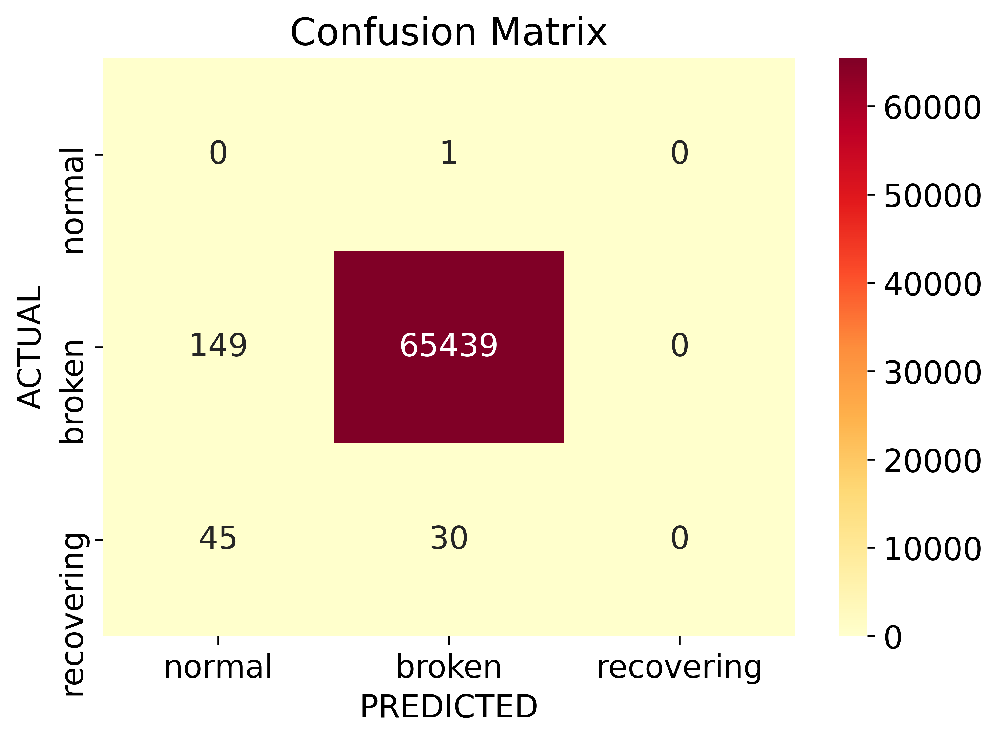


=======================================> PLOTS <=========================================


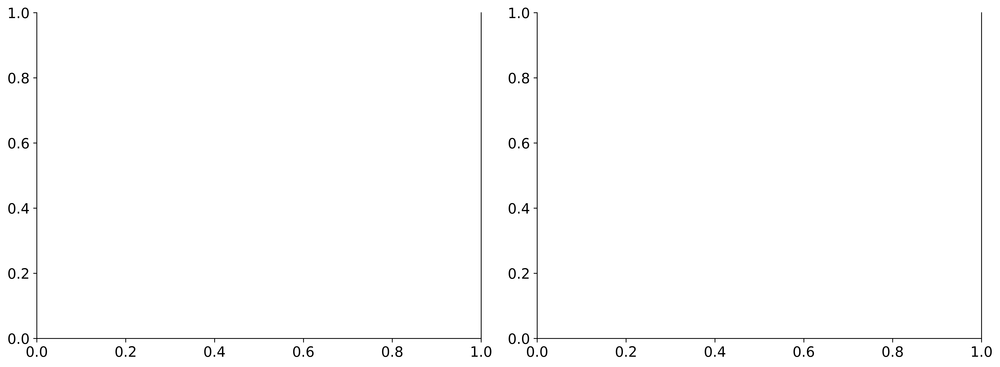

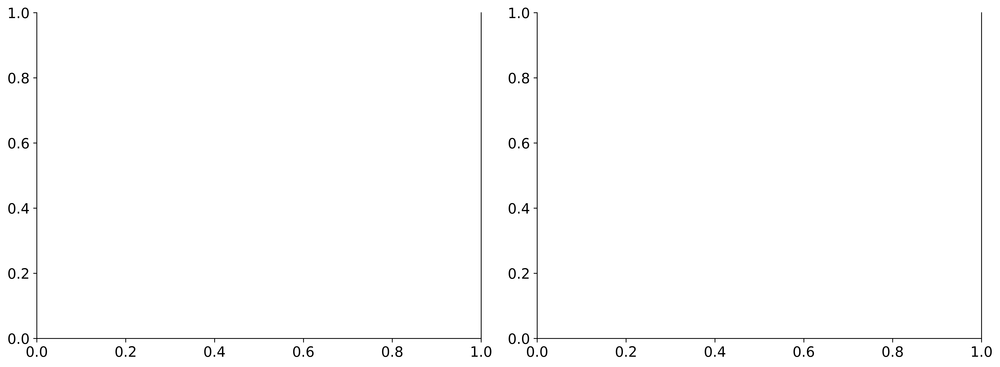

In [82]:
cnn_history = modelCNN.fit(x=X_train, y=y_train,
                    batch_size=BATCHSIZE,
                    epochs=EPOCHS,
                    verbose=1,
                    callbacks=modelCNN_callback,
                    validation_data=(X_test, y_test),
                    shuffle=False,
                    class_weight=CLASS_WEIGHT,
                    steps_per_epoch=STEPS_PER_EPOCH,
                    use_multiprocessing=True)

_, cnn_report = report(modelCNN, X_train, y_train,
                      X_test, y_test,
                    #   display_scores=[metrics.accuracy_score],
                      display_scores=[primary_eval_metric],
                      confusion_labels=confusion_lbs,
                      neural_net=True)

#### CNN-LSTM

In [83]:
tf.keras.backend.clear_session()

In [84]:
cnn_lstm_modelNN = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(FEATURES,)),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape((FEATURES, 1, 1)),  # Reshape for LSTM input
    tf.keras.layers.ConvLSTM1D(4, kernel_size=1, activation='relu', padding='same', kernel_initializer=tf.keras.initializers.GlorotUniform(seed=rng),
                                                       kernel_regularizer=tf.keras.regularizers.l1_l2(l1=0.001, l2=0.001), # Elastic Net regularization
                                                       use_bias=True,
                                                       return_sequences=True), # returns timesteps as well, so 3 dims
    # tf.keras.layers.BatchNormalization(), # batch normalization layer
    # tf.keras.layers.ConvLSTM1D(2, kernel_size=1, activation='relu', padding='same', return_sequences=True),
    # tf.keras.layers.BatchNormalization(), # batch normalization layer
    # tf.keras.layers.ConvLSTM1D(8, kernel_size=1, activation='relu', padding='same', return_sequences=True),
    tf.keras.layers.Flatten(),  # flatten the output of the last pooling layer so it can be fed into dense layers
    tf.keras.layers.Dropout(0.1, seed=rng),
    tf.keras.layers.Dense(CLASSES, activation='softmax')
])
cnn_lstm_modelNN.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.02),
              loss="sparse_categorical_crossentropy",
                metrics=['accuracy'])

cnn_lstm_modelNN.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 batch_normalization (BatchN  (None, 4)                16        
 ormalization)                                                   
                                                                 
 reshape (Reshape)           (None, 4, 1, 1)           0         
                                                                 
 conv_lstm1d (ConvLSTM1D)    (None, 4, 1, 4)           96        
                                                                 
 flatten (Flatten)           (None, 16)                0         
                                                                 
 dropout (Dropout)           (None, 16)                0         
                                                                 
 dense (Dense)               (None, 3)                 51        
                                                        

In [85]:
# # See the inputs and outputs of each layer
# plot_model(
#     cnn_lstm_modelNN, 
#     to_file='./Assets/Model_Architecture/cnn_lstm_modelNN.png',
#     show_shapes=True,
#     show_dtype=True,
#     show_layer_names=True,
#     rankdir='TB',
#     expand_nested=False,
#     dpi=600,
#     layer_range=None,
#     show_layer_activations=True
#     # show_trainable=True # after tf 2.10
# )

In [86]:
# visualkeras.layered_view(cnn_lstm_modelNN, legend=True, to_file='./Assets/Model_Architecture/cnn_lstm_modelNN.png').show()

In [87]:
# Callbacks for NNs
earlystopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', # stop training when the validation loss increases
    # min_delta = 1e-3, # 0.001
    patience = 30,
    mode = 'auto',
    restore_best_weights = True,
    verbose=1
)

checkpointer_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath = '../../code/pump/models/cnn_lstm_modelNN/cnn_lstm_modelNN-{epoch:02d}-{val_loss:.6f}-{val_accuracy:.6f}.h5',
    monitor = 'val_loss',
    save_format='h5',
    overwrite=True,
    save_best_only = True,
    save_weights_only = False,
    mode = 'auto',
    verbose = 1,
)

cnn_lstm_modelNN_callback = [earlystopping_callback, checkpointer_callback]
# to read saved model
# saved_model = load_model('model_name.hdf5')

Epoch 1/1000
1/1 [==============================] - ETA: 0s - loss: 1.1379 - accuracy: 0.5241
Epoch 1: val_loss improved from inf to 1.07210, saving model to ../../code/pump/models/cnn_lstm_modelNN\cnn_lstm_modelNN-01-1.072105-0.681926.h5
1/1 [==============================] - 4s 4s/step - loss: 1.1379 - accuracy: 0.5241 - val_loss: 1.0721 - val_accuracy: 0.6819
Epoch 2/1000
1/1 [==============================] - ETA: 0s - loss: 1.1131 - accuracy: 0.2828
Epoch 2: val_loss did not improve from 1.07210
1/1 [==============================] - 0s 141ms/step - loss: 1.1131 - accuracy: 0.2828 - val_loss: 1.0894 - val_accuracy: 0.7946
Epoch 3/1000
1/1 [==============================] - ETA: 0s - loss: 1.0945 - accuracy: 0.2986
Epoch 3: val_loss did not improve from 1.07210
1/1 [==============================] - 0s 90ms/step - loss: 1.0945 - accuracy: 0.2986 - val_loss: 1.1035 - val_accuracy: 0.2618
Epoch 4/1000
1/1 [==============================] - ETA: 0s - loss: 1.0796 - accuracy: 0.1471
Ep

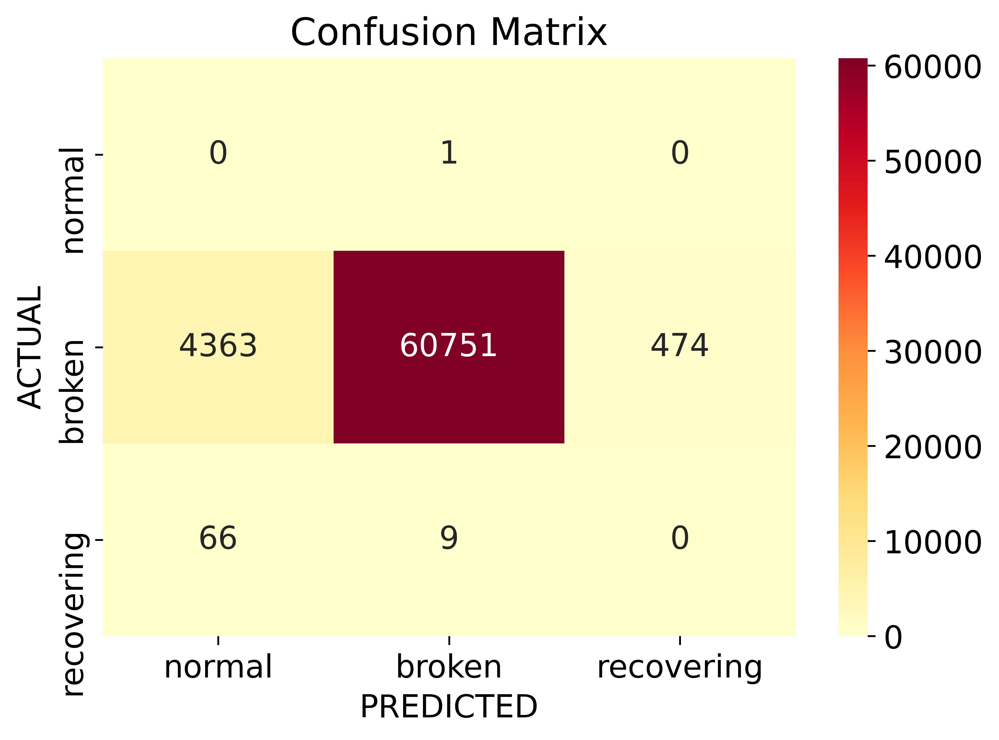


=======================================> PLOTS <=========================================


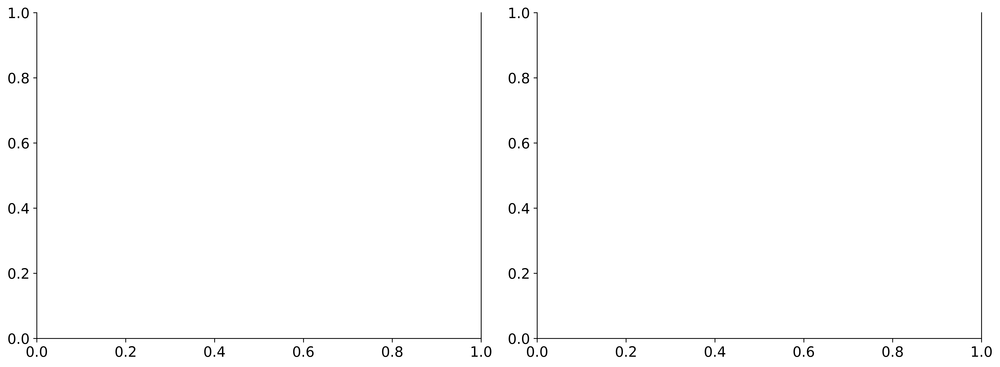

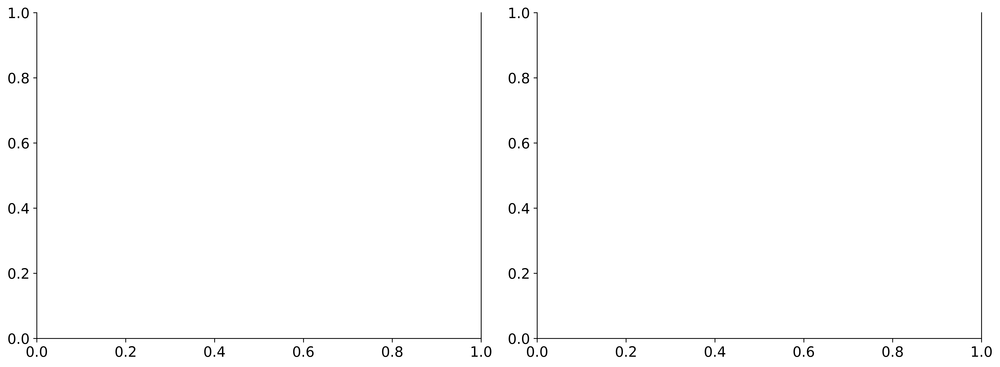

In [88]:
cnn_lstm_history = cnn_lstm_modelNN.fit(x=X_train, y=y_train,
                    batch_size=BATCHSIZE,
                    epochs=EPOCHS,
                    verbose=1,
                    callbacks=cnn_lstm_modelNN_callback,
                    validation_data=(X_test, y_test),
                    shuffle=False,
                    class_weight=CLASS_WEIGHT,
                    steps_per_epoch=STEPS_PER_EPOCH,
                    use_multiprocessing=True)

_, cnn_lstm_nn_report = report(cnn_lstm_modelNN, X_train, y_train,
                      X_test, y_test,
                    #   display_scores=[metrics.accuracy_score],
                      display_scores=[primary_eval_metric],
                      confusion_labels=confusion_lbs,
                      neural_net=True)

<a id="model-comparison"></a>
## 6.   Model Comparison

In [102]:
report_list = [
   nb_report, 
   # logit_report, 
   # knn_report, 
   decision_tree_report,               
   bagging_clf_report, random_forest_report, adaboot_report,
   xgb_report, 
   lgbm_report, catboost_report, 
   cnn_lstm_nn_report,
   cnn_report,
   bi_rnn_lstm_nn_report,
   nn_report,
   # linear_svc_report, 
   # rbf_svc_report
]
clf_labels = [rep['clf'].__class__.__name__ for rep in report_list]
clf_labels[-4] = 'Convolutional LSTM Neural Net'
clf_labels[-3] = 'Convolutional Neural Net'
clf_labels[-2] = 'BiRNN LSTM Neural Net'
clf_labels[-1] = 'Artificial Neural Net'
# clf_labels[-2] = 'Linear SVC'
# clf_labels[-1] = 'RBF SVClassifier'

<a id="evaluation-metrics"></a>
### 6.1.   Evaluation Metrics

Sorted by "Test f1_score" in descending order

In [103]:
compare_table = compare_models(y_test, clf_reports=report_list,
# compare_table, compare_plot = compare_models(y_test, clf_reports=report_list,
                                             labels=clf_labels,
                                             score=primary_eval_metric.__name__)

# compare_table.sort_values(by=['Overfitting', 'Accuracy'], ascending=[True, False])
compare_table.sort_values(by=['Test f1_score', 'Overfitting'], ascending=[False, False])

,Train f1_score,Test f1_score,Overfitting,Train Accuracy,Test Accuracy,Test ROC-AUC
AdaBoostClassifier,0.945365,0.999525,False,0.951154,0.999574,0.969477
RandomForestClassifier,0.99794,0.998902,False,0.997931,0.998766,0.936051
LGBMClassifier,0.996472,0.998612,False,0.996417,0.998919,0.905535
BiRNN LSTM Neural Net,0.862548,0.998576,False,0.90576,0.998782,0.928758
XGBClassifier,0.995269,0.998347,False,0.995255,0.998051,0.906245
Artificial Neural Net,0.861264,0.998264,False,0.905963,0.998843,0.802616
Convolutional Neural Net,0.948287,0.997471,False,0.924936,0.996573,0.800625
DecisionTreeClassifier,0.971186,0.992829,False,0.969703,0.98803,0.494588
BaggingClassifier,0.971175,0.992821,False,0.96969,0.988015,0.832808
GaussianNB,0.967757,0.992043,False,0.965833,0.986477,0.810246


#### Copy table to clip to paste in document

In [104]:
# compare_table.sort_values(by=['Test f1_score', 'Overfitting'], ascending=[False, False]).to_clipboard(sep=',', index=True)

Sorted by "Test f1_score" in descending order (Filtered "Overfitting" == False)

In [105]:
# Exclude overfitting models
compare_table[compare_table['Overfitting'] == False].sort_values(by=['Test f1_score'], ascending=False)

,Train f1_score,Test f1_score,Overfitting,Train Accuracy,Test Accuracy,Test ROC-AUC
AdaBoostClassifier,0.945365,0.999525,False,0.951154,0.999574,0.969477
RandomForestClassifier,0.99794,0.998902,False,0.997931,0.998766,0.936051
LGBMClassifier,0.996472,0.998612,False,0.996417,0.998919,0.905535
BiRNN LSTM Neural Net,0.862548,0.998576,False,0.90576,0.998782,0.928758
XGBClassifier,0.995269,0.998347,False,0.995255,0.998051,0.906245
Artificial Neural Net,0.861264,0.998264,False,0.905963,0.998843,0.802616
Convolutional Neural Net,0.948287,0.997471,False,0.924936,0.996573,0.800625
DecisionTreeClassifier,0.971186,0.992829,False,0.969703,0.98803,0.494588
BaggingClassifier,0.971175,0.992821,False,0.96969,0.988015,0.832808
GaussianNB,0.967757,0.992043,False,0.965833,0.986477,0.810246


#### Copy table to clip to paste in document

In [106]:
# compare_table[compare_table['Overfitting'] == False].sort_values(by=['Test f1_score'], ascending=False).to_clipboard(sep=',', index=True)

Sorted by "Test Accuracy" in descending order (Filtered "Overfitting" == False)

In [107]:
# Exclude overfitting models
compare_table[compare_table['Overfitting'] == False].sort_values(by=['Test Accuracy'], ascending=False)

,Train f1_score,Test f1_score,Overfitting,Train Accuracy,Test Accuracy,Test ROC-AUC
AdaBoostClassifier,0.945365,0.999525,False,0.951154,0.999574,0.969477
LGBMClassifier,0.996472,0.998612,False,0.996417,0.998919,0.905535
Artificial Neural Net,0.861264,0.998264,False,0.905963,0.998843,0.802616
BiRNN LSTM Neural Net,0.862548,0.998576,False,0.90576,0.998782,0.928758
RandomForestClassifier,0.99794,0.998902,False,0.997931,0.998766,0.936051
XGBClassifier,0.995269,0.998347,False,0.995255,0.998051,0.906245
Convolutional Neural Net,0.948287,0.997471,False,0.924936,0.996573,0.800625
DecisionTreeClassifier,0.971186,0.992829,False,0.969703,0.98803,0.494588
BaggingClassifier,0.971175,0.992821,False,0.96969,0.988015,0.832808
GaussianNB,0.967757,0.992043,False,0.965833,0.986477,0.810246


#### Copy table to clip to paste in document

In [108]:
# compare_table[compare_table['Overfitting'] == False].sort_values(by=['Test Accuracy'], ascending=False).to_clipboard(sep=',', index=True)

Sorted by "Test ROC-AUC" in descending order (Filtered "Overfitting" == False)

In [109]:
# Exclude overfitting models
compare_table[compare_table['Overfitting'] == False].sort_values(by=['Test ROC-AUC'], ascending=False)

,Train f1_score,Test f1_score,Overfitting,Train Accuracy,Test Accuracy,Test ROC-AUC
AdaBoostClassifier,0.945365,0.999525,False,0.951154,0.999574,0.969477
RandomForestClassifier,0.99794,0.998902,False,0.997931,0.998766,0.936051
Convolutional LSTM Neural Net,0.955991,0.960525,False,0.933075,0.92518,0.935467
BiRNN LSTM Neural Net,0.862548,0.998576,False,0.90576,0.998782,0.928758
XGBClassifier,0.995269,0.998347,False,0.995255,0.998051,0.906245
LGBMClassifier,0.996472,0.998612,False,0.996417,0.998919,0.905535
BaggingClassifier,0.971175,0.992821,False,0.96969,0.988015,0.832808
GaussianNB,0.967757,0.992043,False,0.965833,0.986477,0.810246
Artificial Neural Net,0.861264,0.998264,False,0.905963,0.998843,0.802616
Convolutional Neural Net,0.948287,0.997471,False,0.924936,0.996573,0.800625


#### Copy table to clip to paste in document

In [110]:
# compare_table[compare_table['Overfitting'] == False].sort_values(by=['Test ROC-AUC'], ascending=False).to_clipboard(sep=',', index=True)

<a id="roc-and-pr-curves"></a>
### 6.2.   ROC and PR Curves

In [111]:
# compare_plot